In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/telecom-churn-case-study-hackathon-C39/solution (1).csv
/kaggle/input/telecom-churn-case-study-hackathon-C39/data_dictionary (1).csv
/kaggle/input/telecom-churn-case-study-hackathon-C39/train (1).csv
/kaggle/input/telecom-churn-case-study-hackathon-C39/test (1).csv


## Case Study on Telecom Churn Prediction
 
 - Vinoda Varshini Rajagopal & Padmavathi D

## 1. Problem Statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn.

In this competition, your goal is to build a machine learning model that is able to predict churning customers based on the features provided for their usage.

### Business Goal 

To identify the customers who are likely to churn

## 2. Data Loading and Description

- Dataset contains following fields

| Column Name   | Description                                               |
| ------------- |:-------------                                            :| 
| CIRCLE_ID |Telecom circle area to which the customer belongs to   | 
| LOC |Local calls  within same telecom circle     |  
| STD |STD calls  outside the calling circle  | 
| IC | Incoming calls |
| OG | Outgoing calls |
| T2T |Operator T to T ie within same operator mobile to mobile |
| T2M | Operator T to other operator mobile |
| T2O | Operator T to other operator fixed line|
| T2F | Operator T to fixed lines of T  |
| T2C | Operator T to its own call center |
| ARPU | Average revenue per user |
| MOU  | Minutes of usage  voice calls |
| AON  | Age on network  number of days the customer is using the operator T network |
| ONNET | All kind of calls within the same operator network |
| OFFNET| All kind of calls outside the operator T network |
| ROAM  | Indicates that customer is in roaming zone during the call |
| SPL   | Special calls  |
| ISD   | ISD calls  |
| RECH  | Recharge  |
| NUM   | Number  |
| AMT   | Amount in local currency |
| MAX   | Maximum  |
| DATA  | Mobile internet  |
| 3G    | G network |
| AV    | Average  |
| VOL   | Mobile internet usage volume in MB |
| 2G    | G network |
| PCK   | Prepaid service schemes called  PACKS |
| NIGHT | Scheme to use during specific night hours only |
| MONTHLY |Service schemes with validity equivalent to a month |
| SACHET  | Service schemes with validity smaller than a month |
| *.6    | KPI for the month of June |
| *.7    | KPI for the month of July |
| *.8    | KPI for the month of August |
| FB_USER | Service scheme to avail services of Facebook and similar social networking sites |
| VBC  | Volume based cost  when no specific scheme is not purchased and paid as per usage |  

__Importing Packages__

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics
sns.set(style='whitegrid', font_scale=1.3, color_codes=True)      # To apply seaborn styles to the plots.
%matplotlib inline                                                
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Making plotly specific imports
# These imports are necessary to use plotly offline without signing in to their website.
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
#import chart_studio.plotly as py
from plotly import tools
init_notebook_mode(connected=True)

__Importing the Train Dataset__

In [ ]:
import io
train_data = pd.read_csv('/kaggle/input/telecom-churn-case-study-hackathon-C39/train (1).csv')

In [3]:
from google.colab import files
data_to_load = files.upload()

Saving train.csv to train.csv


In [4]:
import io
train_data = pd.read_csv(io.BytesIO(data_to_load['train.csv']))

In [5]:
#For displaying maximum rows and columns
train_data.head(10)
pd.set_option('display.max_rows', 500) 
pd.set_option('display.max_columns', 500) 
pd.set_option('display.width', 1000)

In [6]:
train_data.head(6)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.00,0.00,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,Na

### Calculating number of rows and columns in data

In [7]:
rows , columns = train_data.shape # displays the shape of our dataset
print("Dataset has %s rows and %s columns" % (rows, columns))

Dataset has 69999 rows and 172 columns


In [8]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB


__Observation__
- There are **135 columns of float type**, **28 columns of integer type** and **9 columns of object type**.


In [9]:
train_data.describe() 

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

### Converting data type of the feature **churn_probability** to category

In [10]:
train_data['churn_probability'] = train_data['churn_probability'].astype(str)

### Finding columns having maximum unique value

In [11]:
#Selecting categorical fields from the data
telecom_category_features = train_data.select_dtypes(include=['object'])
telecom_category_features.head(4)

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,churn_probability
0,6/30/2014,7/31/2014,8/31/2014,6/22/2014,7/10/2014,8/24/2014,NaN,NaN,NaN,0
1,6/30/2014,7/31/2014,8/31/2014,6/12/2014,7/10/2014,8/26/2014,NaN,7/8/2014,NaN,0
2,6/30/2014,7/31/2014,8/31/2014,6/11/2014,7/22/2014,8/24/2014,NaN,NaN,NaN,0
3,6/30/2014,7/31/2014,8/31/2014,6/15/2014,7/21/2014,8/25/2014,NaN,NaN,NaN,0


In [12]:
#Selecting numeric fields from the data
telecom_numeric_feature = train_data.select_dtypes(include=['int64','float64'])
telecom_numeric_feature.head(4)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,0,109,0.0,0.0,0.0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.0,0.0,0.0,0.0,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.0,0.0,0.0,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.0,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.0,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0
1,1,109,0.0,0.0,0.0,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.4,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,145.0,NaN,0.0,352.91,0.0,0.0,3.96,0.0,NaN,122.07,NaN,NaN,122.08,NaN,NaN,0.0,NaN,0,0,0,0,0,0,0,1,0,0,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0
2,2,109,0.0,0.0,0.0,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.0,0.0,0.0,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.0

In [13]:
# Frequently occuring single value from categorical columns
def telecom_occurance(telecom_category_features):
    data_occur = []
    for i in telecom_category_features.columns:
        occurance_count = telecom_category_features[i].value_counts()
        count_total = occurance_count.iloc[0]
        if count_total / len(telecom_category_features) * 100 > 98:
            data_occur.append(i)
    data_occur = list(data_occur)
    return data_occur

In [14]:
telecom_occurance(telecom_category_features)

['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8']

In [15]:
# Frequently occuring single value from numerical columns
def telecom_occurance(telecom_numeric_feature):
    tele_occur = []
    for i in telecom_numeric_feature.columns:
        occurance_count = telecom_numeric_feature[i].value_counts()
        count_total = occurance_count.iloc[0]
        if count_total / len(telecom_numeric_feature) * 100 > 98:
            tele_occur.append(i)
    tele_occur = list(tele_occur)
    return tele_occur

In [16]:
telecom_occurance(telecom_numeric_feature)

['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou']

### Dropping Columns based on unique value > 98%

In [17]:
train_data.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou'], axis = 1, inplace = True)

In [18]:
train_data.head(5)

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,145.0,NaN,0.0,352.91,0.00,0.0,3.96,0.0,NaN,122.07,NaN,NaN,122.08,NaN,NaN,0.0,NaN,0,0,0,0,0,0,0,1,0,0,0,0,NaN,1.0,NaN,710,0.0,0.0,0.0,0
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.

### Finding Duplicate rows in data

In [19]:
# Checking for Duplicate entries in dataset
row, column = train_data[train_data.duplicated()].shape
print('There is no duplicate records in our dataset.' if row==0 else f'There are {row} duplicates in the dataset.')

There is no duplicate records in our dataset.


In [21]:
# displays the shape of our dataset
rows , columns = train_data.shape 
print("Before processing our dataset has %s rows and %s columns" % (rows, columns))

Before processing our dataset has 69999 rows and 165 columns


In [22]:
# Counting percentage of Churn and Non-churn
train_data['churn_probability'].value_counts()/len(train_data)*100

0    89.811283
1    10.188717
Name: churn_probability, dtype: float64

__Observation__
- Our dataset has __89.81 %__ __non-churn__ customers and __10.18%__ of customers __who left the network__.

## Extracting High-Value Customers

In [23]:
train_data['total_rech_data_amt_6'] = train_data['av_rech_amt_data_6'] * train_data['total_rech_data_6']
train_data['total_rech_data_amt_7'] = train_data['av_rech_amt_data_7'] * train_data['total_rech_data_7']
train_data['total_rech_data_amt_8'] = train_data['av_rech_amt_data_8'] * train_data['total_rech_data_8']

In [24]:
# calculating average recharge of customers
average_rech_6n7 = (train_data['total_rech_amt_6'].fillna(0) + train_data['total_rech_amt_7'].fillna(0) + train_data['total_rech_data_amt_6'].fillna(0) + train_data['total_rech_data_amt_7'].fillna(0))/2

In [25]:
# Extracting upto 70th percentile
avg_70_percentile_6n7 = np.percentile(average_rech_6n7, 70.0)
print("70 percentile is : ", avg_70_percentile_6n7)

70 percentile is :  477.5


In [26]:
# fitler the given data set based on 70th percentile
high_val_cust = train_data[average_rech_6n7 >= avg_70_percentile_6n7]
print("Dimensions of the filtered dataset:",high_val_cust.shape)

Dimensions of the filtered dataset: (21013, 168)


In [27]:
high_val_cust.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,total_rech_data_amt_6,total_rech_data_amt_7,total_rech_data_amt_8
4,4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,0.0,0.0,10.16,4.83,6.13,36.74,19.88,4.61,11.99,1.23,5.01,0.0,9.85,0.00,58.91,25.94,15.76,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.0,0.0,0.00,17.00,0.00,0.0,0.0,0.0,63.26,42.94,15.76,5.44,1.39,2.66,10.58,4.33,19.49,5.51,3.63,6.14,21.54,9.36,28.31,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,21.54,9.36,28.31,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,13,10,8,290,136,122,50,41,30,6/25/2014,7/26/2014,8/30/2014,25,10,30,6/25/2014,7/23/2014,8/20/2014,7.0,7.0,6.0,25.0,41.0,25.0,7.0,6.0,6.0,0.0,1.0,0.0,175.0,191.0,142.0,390.80,308.89,213.47,0.0,0.00,0.00,0.00,35.00,0.00,0.00,35.12,0.00,0.0,0.0,0.0,0,0,0,7,6,6,0,0,0,0,1,0,1.0,1.0,1.0,647,0.0,0.00,0.00,0,1225.0,1337.0,852.0
15,15,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,0.0,0.0,0.00,0.0,0.0,10.43,24.99,194.43,313.76,330.88,185.88,3.26,10.91,4.94,0.0,0.00,0.00,327.46,366.79,385.26,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,6.26,0.0,0.0,0.0,0.00,0.00,6.26,0.0,0.0,0.0,0.08,0.00,0.00,0.1,0.0,0.0,327.64,366.79,391.53,13.86,20.18,335.43,219.31,754.24,285.63,0.00,1.93,8.88,233.18,776.36,629.94,0.0,0.0,0.0,0.00,0.00,0.00,0.00,1.03,0.0,0.0,0.0,0.0,0.00,1.03,0.00,233.18,777.39,629.94,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,5,3,4,654,400,652,250,250,250,6/27/2014,7/25/2014,8/30/2014,0,150,250,6/16/2014,NaN,8/2/2014,1.0,NaN,1.0,154.0,NaN,154.0,1.0,NaN,1.0,0.0,NaN,0.0,154.0,NaN,154.0,260.42,0.00,354.3

In [28]:
# Counting percentage of Churn and Non-churn
high_val_cust['churn_probability'].value_counts()/len(train_data)*100

0    27.534679
1     2.484321
Name: churn_probability, dtype: float64

__Observation on High Value Customer__
- There are limited number of customers who leave the nutwork being high value customers.

### Calculating missing values of the features


In [29]:
# Finding percentage of missing values
percent_missing_value = print(round(train_data.isnull().sum()/len(train_data.index)*100,2).sort_values(ascending=False))

arpu_2g_6                   74.90
night_pck_user_6            74.90
max_rech_data_6             74.90
count_rech_3g_6             74.90
av_rech_amt_data_6          74.90
arpu_3g_6                   74.90
total_rech_data_6           74.90
count_rech_2g_6             74.90
total_rech_data_amt_6       74.90
fb_user_6                   74.90
date_of_last_rech_data_6    74.90
night_pck_user_7            74.48
av_rech_amt_data_7          74.48
max_rech_data_7             74.48
total_rech_data_amt_7       74.48
count_rech_3g_7             74.48
total_rech_data_7           74.48
date_of_last_rech_data_7    74.48
fb_user_7                   74.48
arpu_3g_7                   74.48
arpu_2g_7                   74.48
count_rech_2g_7             74.48
total_rech_data_8           73.69
max_rech_data_8             73.69
date_of_last_rech_data_8    73.69
total_rech_data_amt_8       73.69
count_rech_3g_8             73.69
av_rech_amt_data_8          73.69
arpu_3g_8                   73.69
arpu_2g_8     

In [30]:
# Droping columns which has 70% missing values
train_data = train_data[train_data.columns[train_data.isnull().mean() < 0.7]]

In [31]:
# Finding percentage of missing values
percent_missing_value = print(round(train_data.isnull().sum()/len(train_data.index)*100,2).sort_values(ascending=False))

loc_og_t2m_mou_8       5.29
loc_og_t2t_mou_8       5.29
std_og_mou_8           5.29
std_ic_t2t_mou_8       5.29
loc_og_t2f_mou_8       5.29
loc_ic_mou_8           5.29
loc_ic_t2f_mou_8       5.29
loc_og_t2c_mou_8       5.29
loc_ic_t2m_mou_8       5.29
loc_og_mou_8           5.29
loc_ic_t2t_mou_8       5.29
std_og_t2t_mou_8       5.29
og_others_8            5.29
std_og_t2m_mou_8       5.29
spl_og_mou_8           5.29
std_og_t2f_mou_8       5.29
isd_og_mou_8           5.29
std_ic_t2m_mou_8       5.29
std_og_t2c_mou_8       5.29
onnet_mou_8            5.29
std_ic_t2f_mou_8       5.29
roam_og_mou_8          5.29
ic_others_8            5.29
std_ic_t2o_mou_8       5.29
roam_ic_mou_8          5.29
isd_ic_mou_8           5.29
std_ic_mou_8           5.29
offnet_mou_8           5.29
spl_ic_mou_8           5.29
std_ic_t2f_mou_6       3.95
isd_og_mou_6           3.95
ic_others_6            3.95
og_others_6            3.95
isd_ic_mou_6           3.95
loc_ic_t2m_mou_6       3.95
loc_ic_t2t_mou_6    

In [32]:
# Finding percentage of missing values
percent_missing_value = print(round(train_data.isnull().sum()/len(train_data.index)*100,2).sort_values(ascending=False))

loc_og_t2m_mou_8       5.29
loc_og_t2t_mou_8       5.29
std_og_mou_8           5.29
std_ic_t2t_mou_8       5.29
loc_og_t2f_mou_8       5.29
loc_ic_mou_8           5.29
loc_ic_t2f_mou_8       5.29
loc_og_t2c_mou_8       5.29
loc_ic_t2m_mou_8       5.29
loc_og_mou_8           5.29
loc_ic_t2t_mou_8       5.29
std_og_t2t_mou_8       5.29
og_others_8            5.29
std_og_t2m_mou_8       5.29
spl_og_mou_8           5.29
std_og_t2f_mou_8       5.29
isd_og_mou_8           5.29
std_ic_t2m_mou_8       5.29
std_og_t2c_mou_8       5.29
onnet_mou_8            5.29
std_ic_t2f_mou_8       5.29
roam_og_mou_8          5.29
ic_others_8            5.29
std_ic_t2o_mou_8       5.29
roam_ic_mou_8          5.29
isd_ic_mou_8           5.29
std_ic_mou_8           5.29
offnet_mou_8           5.29
spl_ic_mou_8           5.29
std_ic_t2f_mou_6       3.95
isd_og_mou_6           3.95
ic_others_6            3.95
og_others_6            3.95
isd_ic_mou_6           3.95
loc_ic_t2m_mou_6       3.95
loc_ic_t2t_mou_6    

__Observation__
- Some of the features have less than 6% missing values. 
- If we drop those records we need to drop (8104 resords), we will have severe skewness in our dataset.
- So, let us treat these missing values by imputing values.

## Missing value treatment

- **Replacing missing values of the data frame with zero**, as it depends on the nature of the features and target variable and we are concerned about the churning of customers. So, the values could not be replaced with mean value. 

- Since, most of the customers are leaving the company and we find that there is no incoming and outgoing calls when they churn, we are replacing the missing values of these columns by '0'.

In [33]:
# Replace missing values with 0
train_data = train_data.replace(np.nan,0)

In [34]:
train_data.isnull().sum()

id                     0
arpu_6                 0
arpu_7                 0
arpu_8                 0
onnet_mou_6            0
onnet_mou_7            0
onnet_mou_8            0
offnet_mou_6           0
offnet_mou_7           0
offnet_mou_8           0
roam_ic_mou_6          0
roam_ic_mou_7          0
roam_ic_mou_8          0
roam_og_mou_6          0
roam_og_mou_7          0
roam_og_mou_8          0
loc_og_t2t_mou_6       0
loc_og_t2t_mou_7       0
loc_og_t2t_mou_8       0
loc_og_t2m_mou_6       0
loc_og_t2m_mou_7       0
loc_og_t2m_mou_8       0
loc_og_t2f_mou_6       0
loc_og_t2f_mou_7       0
loc_og_t2f_mou_8       0
loc_og_t2c_mou_6       0
loc_og_t2c_mou_7       0
loc_og_t2c_mou_8       0
loc_og_mou_6           0
loc_og_mou_7           0
loc_og_mou_8           0
std_og_t2t_mou_6       0
std_og_t2t_mou_7       0
std_og_t2t_mou_8       0
std_og_t2m_mou_6       0
std_og_t2m_mou_7       0
std_og_t2m_mou_8       0
std_og_t2f_mou_6       0
std_og_t2f_mou_7       0
std_og_t2f_mou_8       0


In [35]:
# describe the dataset
train_data.describe() 

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.00000
mean,34999.000000,283.134365,278.185912,278.858826,127.887939,128.754731,125.943607,191.010582,189.585401,186.146273,9.379276,6.745305,6.634328,13.625476,9.464386,9.254848,45.050076,44.394344,43.269280,89.551272,87.313796,86.301054,3.595161,3.632045,3.467948,1.081499,1.308807,1.345676,138.203540,135.347249,133.045174,77.431415,80.560009,79.055781,84.666274,88.024790,85.794878,1.081836,1.042449,1.001784,0.0,0.0,0.0,163.182149,169.629

In [37]:
# total records in dataset
len(train_data.index)

69999

In [38]:
# displays the shape of our dataset
rows , columns = train_data.shape 
print("After treating missing values our dataset has %s rows and %s columns" % (rows, columns))

After treating missing values our dataset has 69999 rows and 135 columns


In [39]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 135 entries, id to churn_probability
dtypes: float64(105), int64(26), object(4)
memory usage: 72.1+ MB


## Feature Engineering
Separating **Date** from **date_of_last_rech_6, date_of_last_rech_7 and date_of_last_rech_8**

In [40]:
train_data[["rech_month_june", "rech_date_june2014", "rech_year_june"]] = train_data["date_of_last_rech_6"].str.split("/", expand = True)
train_data[["rech_month_july", "rech_date_july2014", "rech_year_july"]] = train_data["date_of_last_rech_7"].str.split("/", expand = True)
train_data[["rech_month_august", "rech_date_august2014", "rech_year_august"]] = train_data["date_of_last_rech_8"].str.split("/", expand = True)
train_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rech_month_june,rech_date_june2014,rech_year_june,rech_month_july,rech_date_july2014,rech_year_july,rech_month_august,rech_date_august2014,rech_year_august
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,6,22,2014,7,10,2014,8,24,2014
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,0.0,352.91,0.00,0.0,3.96,0.0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,6,12,2014,7,10,2014,8,26,2014
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,6/11/2014,7/22/2014,8/24/2014,70,50,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,

In [41]:
train_data.drop(['rech_month_june','rech_month_july','rech_month_august','rech_year_june','rech_year_july','rech_year_august'], axis = 1, inplace = True)
train_data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis = 1, inplace = True)
train_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,22,10,24
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0.0,352.91,0.00,0.0,3.96,0.0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,12,10,26
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,11,22,24
3,3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.6

In [42]:
train_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,22,10,24
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0.0,352.91,0.00,0.0,3.96,0.0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,12,10,26
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,11,22,24
3,3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.6

In [43]:
train_data.isnull().sum()

id                         0
arpu_6                     0
arpu_7                     0
arpu_8                     0
onnet_mou_6                0
onnet_mou_7                0
onnet_mou_8                0
offnet_mou_6               0
offnet_mou_7               0
offnet_mou_8               0
roam_ic_mou_6              0
roam_ic_mou_7              0
roam_ic_mou_8              0
roam_og_mou_6              0
roam_og_mou_7              0
roam_og_mou_8              0
loc_og_t2t_mou_6           0
loc_og_t2t_mou_7           0
loc_og_t2t_mou_8           0
loc_og_t2m_mou_6           0
loc_og_t2m_mou_7           0
loc_og_t2m_mou_8           0
loc_og_t2f_mou_6           0
loc_og_t2f_mou_7           0
loc_og_t2f_mou_8           0
loc_og_t2c_mou_6           0
loc_og_t2c_mou_7           0
loc_og_t2c_mou_8           0
loc_og_mou_6               0
loc_og_mou_7               0
loc_og_mou_8               0
std_og_t2t_mou_6           0
std_og_t2t_mou_7           0
std_og_t2t_mou_8           0
std_og_t2m_mou

In [44]:
# Replace missing values with 0
train_data = train_data.replace(np.nan,0)

In [45]:
train_data.isnull().sum()

id                      0
arpu_6                  0
arpu_7                  0
arpu_8                  0
onnet_mou_6             0
onnet_mou_7             0
onnet_mou_8             0
offnet_mou_6            0
offnet_mou_7            0
offnet_mou_8            0
roam_ic_mou_6           0
roam_ic_mou_7           0
roam_ic_mou_8           0
roam_og_mou_6           0
roam_og_mou_7           0
roam_og_mou_8           0
loc_og_t2t_mou_6        0
loc_og_t2t_mou_7        0
loc_og_t2t_mou_8        0
loc_og_t2m_mou_6        0
loc_og_t2m_mou_7        0
loc_og_t2m_mou_8        0
loc_og_t2f_mou_6        0
loc_og_t2f_mou_7        0
loc_og_t2f_mou_8        0
loc_og_t2c_mou_6        0
loc_og_t2c_mou_7        0
loc_og_t2c_mou_8        0
loc_og_mou_6            0
loc_og_mou_7            0
loc_og_mou_8            0
std_og_t2t_mou_6        0
std_og_t2t_mou_7        0
std_og_t2t_mou_8        0
std_og_t2m_mou_6        0
std_og_t2m_mou_7        0
std_og_t2m_mou_8        0
std_og_t2f_mou_6        0
std_og_t2f_m

__Observation__
- There is no missing values in our data.

### Converting rech_date_june2014, rech_date_july2014 ,rech_date_august2014 to integer type to perform calculations.

In [46]:
train_data['rech_date_june2014'] = train_data['rech_date_june2014'].astype(int)   # using astype() to convert datatype
train_data['rech_date_july2014'] = train_data['rech_date_july2014'].astype(int)
train_data['rech_date_august2014'] = train_data['rech_date_august2014'].astype(int)  


In [47]:
# Replace values of columns by using DataFrame.loc[] property.
train_data.loc[train_data['rech_date_june2014'] > 1, 'rech_date_june2014'] = 1
train_data.loc[train_data['rech_date_july2014'] > 1, 'rech_date_july2014'] = 1
train_data.loc[train_data['rech_date_august2014'] > 1, 'rech_date_august2014'] = 1

In [48]:
# Converting datatype of features to object
train_data['rech_date_june2014'] = train_data['rech_date_june2014'].astype(str)
train_data['rech_date_july2014'] = train_data['rech_date_july2014'].astype(str)
train_data['rech_date_august2014'] = train_data['rech_date_august2014'].astype(str)

In [49]:
train_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014
0,0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,1,1,1
1,1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0.0,352.91,0.00,0.0,3.96,0.0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,1,1,1
2,2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0.0,0.00,0.00,0.0,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,1,1,1
3,3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0

In [50]:
train_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 135 columns):
 #    Column                Dtype  
---   ------                -----  
 0    id                    int64  
 1    arpu_6                float64
 2    arpu_7                float64
 3    arpu_8                float64
 4    onnet_mou_6           float64
 5    onnet_mou_7           float64
 6    onnet_mou_8           float64
 7    offnet_mou_6          float64
 8    offnet_mou_7          float64
 9    offnet_mou_8          float64
 10   roam_ic_mou_6         float64
 11   roam_ic_mou_7         float64
 12   roam_ic_mou_8         float64
 13   roam_og_mou_6         float64
 14   roam_og_mou_7         float64
 15   roam_og_mou_8         float64
 16   loc_og_t2t_mou_6      float64
 17   loc_og_t2t_mou_7      float64
 18   loc_og_t2t_mou_8      float64
 19   loc_og_t2m_mou_6      float64
 20   loc_og_t2m_mou_7      float64
 21   loc_og_t2m_mou_8      float64
 22   loc_og_t2f_mou_6    

### Calculating total Onnet(All kind of calls within the same operator network) and total offnet(All kind of calls outside the operator T network)

In [51]:
telecom_columns = train_data.columns.tolist()

In [52]:
# Seperating columns for onnet and offnet
onnet_columns = [col for col in telecom_columns if 'onnet' in col]
offnet_columns = [col for col in telecom_columns if 'offnet' in col]

# Sum of all the onnet and offnet columns
train_data['onnet_total'] = train_data[onnet_columns].sum(axis = 1)
train_data['offnet_total'] = train_data[offnet_columns].sum(axis = 1)

# Seperating vol_2g and vol_3g columns
vol_2g_columns = [col for col in telecom_columns if 'vol' in col and '2g' in col]
vol_3g_columns = [col for col in telecom_columns if 'vol' in col and '3g' in col]

# Sum of all vol_2g and vol_3g
train_data['vol_2g_total'] = train_data[vol_2g_columns].sum(axis = 1)
train_data['vol_3g_total'] = train_data[vol_3g_columns].sum(axis = 1)

# Separating vbc columns
vbc_columns = [col for col in telecom_columns if 'vbc' in col]

# Sum of all vbc columns
train_data['vbc_columns_total'] = train_data[vbc_columns].sum(axis = 1)


In [53]:
vbc_columns

['aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g']

In [54]:
# drop the columns that were converted to new column
train_data.drop(['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','aug_vbc_3g','jul_vbc_3g','jun_vbc_3g'], axis = 1, inplace = True)

In [55]:
train_data.head(5)

,id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,174.25,131.25,0.00,0.00,0.0
1,1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,0.00,56.88,352.91,3.96,0.0
2,2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,16.46,136.04,0.00,0.00,0.0
3,3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,8.89,0.28,2.81,95.11,50.18,83.84,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,160,240,130,110,110,50,110,1

In [56]:
train_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 125 columns):
 #    Column                Dtype  
---   ------                -----  
 0    id                    int64  
 1    arpu_6                float64
 2    arpu_7                float64
 3    arpu_8                float64
 4    roam_ic_mou_6         float64
 5    roam_ic_mou_7         float64
 6    roam_ic_mou_8         float64
 7    roam_og_mou_6         float64
 8    roam_og_mou_7         float64
 9    roam_og_mou_8         float64
 10   loc_og_t2t_mou_6      float64
 11   loc_og_t2t_mou_7      float64
 12   loc_og_t2t_mou_8      float64
 13   loc_og_t2m_mou_6      float64
 14   loc_og_t2m_mou_7      float64
 15   loc_og_t2m_mou_8      float64
 16   loc_og_t2f_mou_6      float64
 17   loc_og_t2f_mou_7      float64
 18   loc_og_t2f_mou_8      float64
 19   loc_og_t2c_mou_6      float64
 20   loc_og_t2c_mou_7      float64
 21   loc_og_t2c_mou_8      float64
 22   loc_og_mou_6        

## Exploratory Data Analysis

In [57]:
telecom_EDA = train_data
telecom_EDA.head(6)

,id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.00,0.00,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,174.25,131.25,0.00,0.00,0.0
1,1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,0.00,56.88,352.91,3.96,0.0
2,2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.00,0.00,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,16.46,136.04,0.00,0.00,0.0
3,3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.00,0.00,0.0,0.0,0.0,8.89,0.28,2.81,95.11,50.18,83.84,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,160,240,130,110,110,

### What is the Churn Probability based on Recharge Amount?

Text(0.5, 1.0, 'Recharge Amount vs Churn Probability')

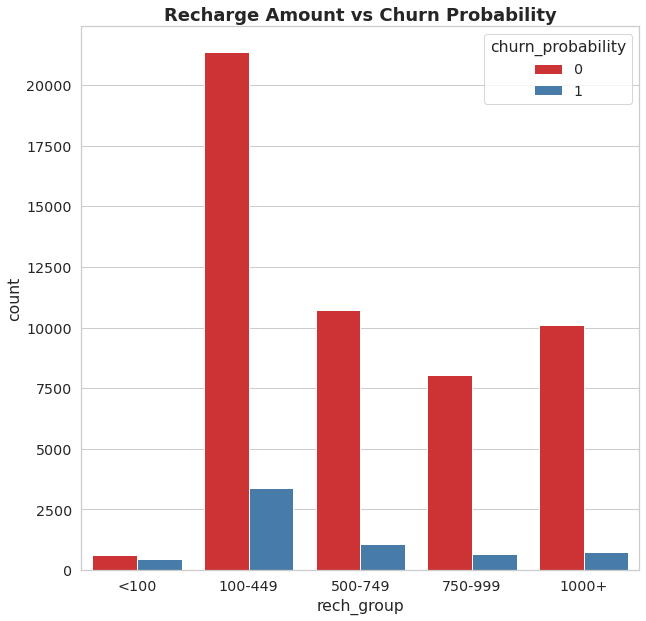

In [58]:
# Seperating columns for total recharge
tot_recharge_columns = [col for col in telecom_columns if 'total_rech_amt' in col]

# Sum of all the recharge column
telecom_EDA['total_recharge'] = telecom_EDA[tot_recharge_columns].sum(axis = 1)

# Creating group for reacharge amount
telecom_EDA['rech_group'] = pd.cut(telecom_EDA['total_recharge'],[0,100,500,750,1000,1500],labels=['<100','100-449','500-749','750-999','1000+'], include_lowest=True)

fig,ax =plt.subplots(figsize=(10,10))
sns.countplot(data = telecom_EDA,x = 'rech_group', hue='churn_probability',palette='Set1')
plt.title('Recharge Amount vs Churn Probability',fontsize=18,fontweight="bold")

__Observation__
- Based on the recharge pattern of the customers, high number of customers who recharge in the amount between **amount 100 to 499 are leaving the telecom company**.

- Also more number of customers prefer to recharge in the amount between 100 to 499.

- only very less number of customers churn the telecom company who recharge less than 100.

### What is the Churn probability based on customer's age on network?

Text(0.5, 1.0, 'Customers age on network vs Churn Probability')

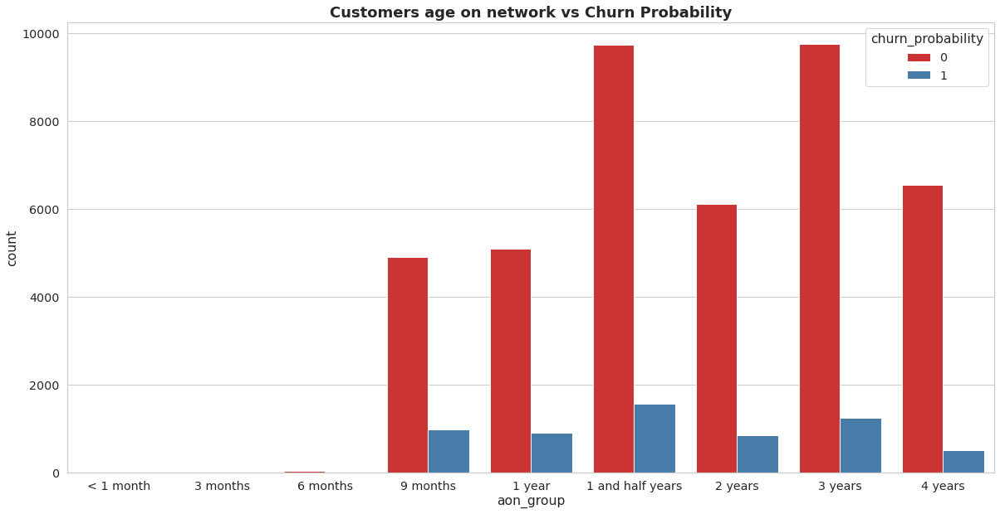

In [59]:
# Creating group for age on network
telecom_EDA['aon_group'] = pd.cut(telecom_EDA['aon'],[0,30,90,180,270,365,550,725,1095,1460],labels=['< 1 month','3 months','6 months','9 months','1 year','1 and half years','2 years','3 years','4 years' ], include_lowest=True)

fig,ax =plt.subplots(figsize=(20,10))
sns.countplot(data = telecom_EDA,x = 'aon_group', hue='churn_probability',palette='Set1')
plt.title('Customers age on network vs Churn Probability',fontsize=18,fontweight="bold")

__Observation__
- Customers tend to **leave the network after 9 months** of using the services.
- **High number of churning** could be observed **during 1 and half years and 3 years of using the network**.

- **More number of a customer** using the network for **3 years**.
- We can observe a **fall in customer retention** after **1 and half years** and **3 years**.

### Analysis on Target variable **churn_probability** for High-Value Customers

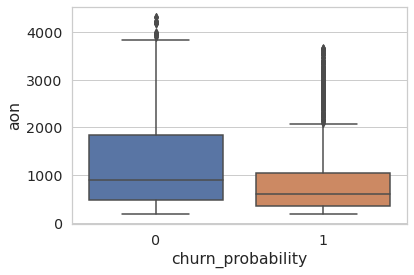

In [60]:
# Churn probability for high-value customers
sns.boxplot(x = high_val_cust.churn_probability, y = high_val_cust.aon)

### Churn probability for train data

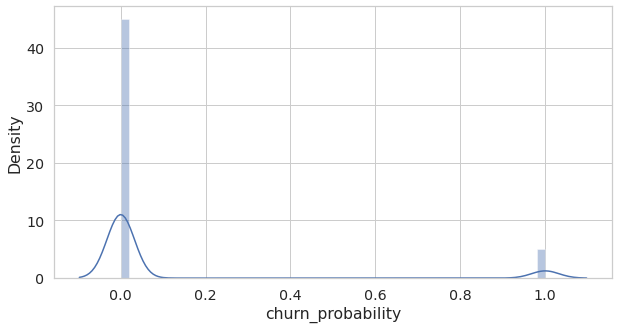

In [61]:
fig,ax =plt.subplots(figsize=(10,5))
sns.set(color_codes=True)                                                # Plot a histogram of the respondents' ages (remove any NaN values)
sns.set_palette(sns.color_palette("muted"))

sns.distplot(telecom_EDA["churn_probability"]);

In [62]:
# Counting percentage of Churn and Non-churn
telecom_EDA['churn_probability'].value_counts()/len(telecom_EDA)*100

0    89.811283
1    10.188717
Name: churn_probability, dtype: float64

__Observation__
- Churn probability is **high for non-churn customers 89.81%** and **less for churning customers 10.18**.

### How does the number of recharge impacts average revenue per user?

Text(0.5, 1.0, 'Average revenue per customer based on number of recharges')

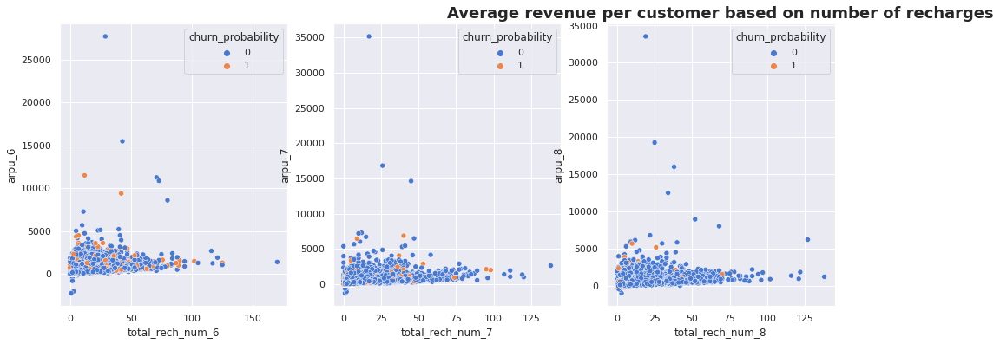

In [63]:
# plotting to find number of recharges and average revenue
_,ax = plt.subplots(1, 3, figsize= (16, 6))
sns.scatterplot(x="total_rech_num_6", y = "arpu_6" , hue="churn_probability", data=telecom_EDA, ax=ax[0])
sns.scatterplot(x="total_rech_num_7", y = "arpu_7" , hue="churn_probability", data=telecom_EDA, ax=ax[1])
sns.scatterplot(x="total_rech_num_8", y = "arpu_8" , hue="churn_probability", data=telecom_EDA, ax=ax[2])

plt.title('Average revenue per customer based on number of recharges',fontsize=18,fontweight="bold")

__Observation__
- Total recharges for the month of June and average revenue per user is plotted in the first scatter plot.
   - Total number of recharges for the month of June is more between 0 to 50, so average revenue also quite good for this frequency.

- Total recharges for the month of July and its average revenue per user is plotted in the second scatter plot.   
   - For the month of July, more number of recharges are around 0 to 25.
   - Compared to June, July has high average revenus per user.

- Total recharges for the month of August and its average revenue per user is plotted in the third scatter plot.
   - Compared to June and July, few users have contributed to increase in average revenue.   

### Customer churn based on Age on Network with Onnet total, offnet total and total recharge

Text(0.5, 1.0, 'Customer churn and non-churn based on total recharge & Age on Network')

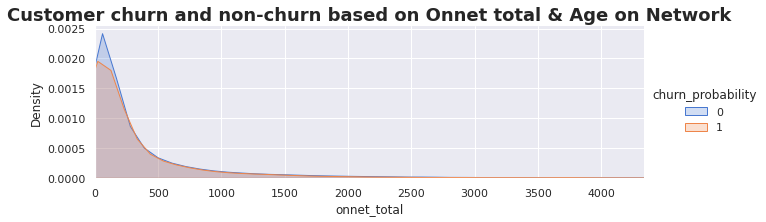

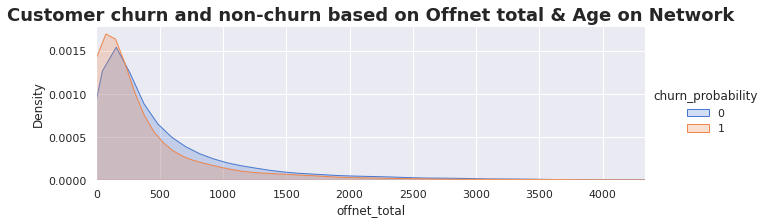

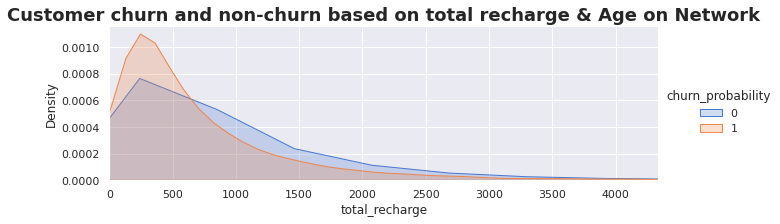

In [64]:
# plotting to find churning of customers based on recharge amount
facet = sns.FacetGrid(telecom_EDA, hue = "churn_probability", aspect = 3)
facet.map(sns.kdeplot,"onnet_total",shade= True)
facet.set(xlim=(0, telecom_EDA["aon"].max()))
facet.add_legend()
plt.title('Customer churn and non-churn based on Onnet total & Age on Network',fontsize=18,fontweight="bold")

facet = sns.FacetGrid(telecom_EDA, hue = "churn_probability", aspect = 3)
facet.map(sns.kdeplot,"offnet_total",shade= True)
facet.set(xlim=(0, telecom_EDA["aon"].max()))
facet.add_legend()
plt.title('Customer churn and non-churn based on Offnet total & Age on Network',fontsize=18,fontweight="bold")

facet = sns.FacetGrid(telecom_EDA, hue = "churn_probability", aspect = 3)
facet.map(sns.kdeplot,"total_recharge",shade= True)
facet.set(xlim=(0, telecom_EDA["aon"].max()))
facet.add_legend()
plt.title('Customer churn and non-churn based on total recharge & Age on Network',fontsize=18,fontweight="bold")


__Observation__
- Churn probability is less when comparing onnet total and age on network. More number of customers retain on same network for the same network usage.

- Customers tend o churn when comparing the offnet total and age on network.

- Density is more for the churning of customers, when the total recharge amount is around 500. 

### How many times a customer recharges based on amount and what is the churn pattern?

Text(0.5, 1.0, 'Average revenue per customer based on number of recharges')

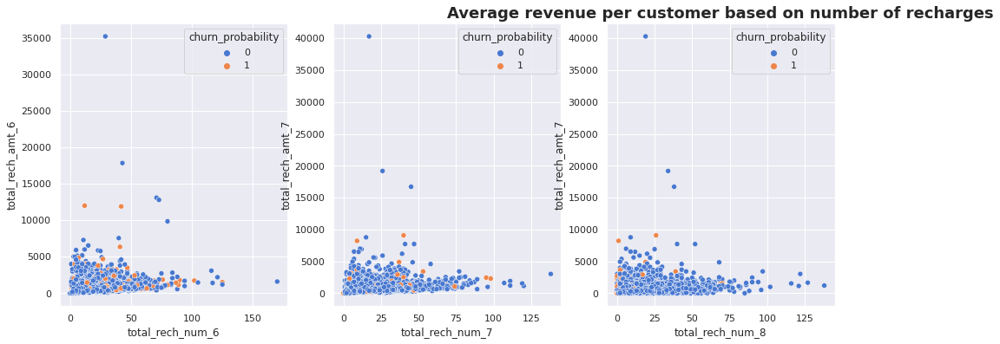

In [65]:
# Plotting to find churning pattern based on recharge frequency and amount
_,ax = plt.subplots(1, 3, figsize= (16, 6))
sns.scatterplot(x="total_rech_num_6", y = "total_rech_amt_6" , hue="churn_probability", data=telecom_EDA, ax=ax[0])
sns.scatterplot(x="total_rech_num_7", y = "total_rech_amt_7" , hue="churn_probability", data=telecom_EDA, ax=ax[1])
sns.scatterplot(x="total_rech_num_8", y = "total_rech_amt_7" , hue="churn_probability", data=telecom_EDA, ax=ax[2])
plt.title('Average revenue per customer based on number of recharges',fontsize=18,fontweight="bold")

__Observation__
- Churn probability is more during June comapred to remaining months.
- Less number of customers were churned during August.
- More number of customers prefer the same network and  the number of recharges and recharge amount have increased in August.

In [66]:
telecom_EDA.head(5)

,id,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total,total_recharge,rech_group,aon_group
0,0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,174.25,131.25,0.00,0.00,0.0,152,100-449,NaN
1,1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,0.00,56.88,352.91,3.96,0.0,195,100-449,2 years
2,2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,16.46,136.04,0.00,0.00,0.0,190,100-449,3 years
3,3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,8.89,0.28,2.81,

### What is the roaming incomming call pattern for customers based on churning?

Text(0.5, 1.0, 'Roam incom call vs Churn Probability')

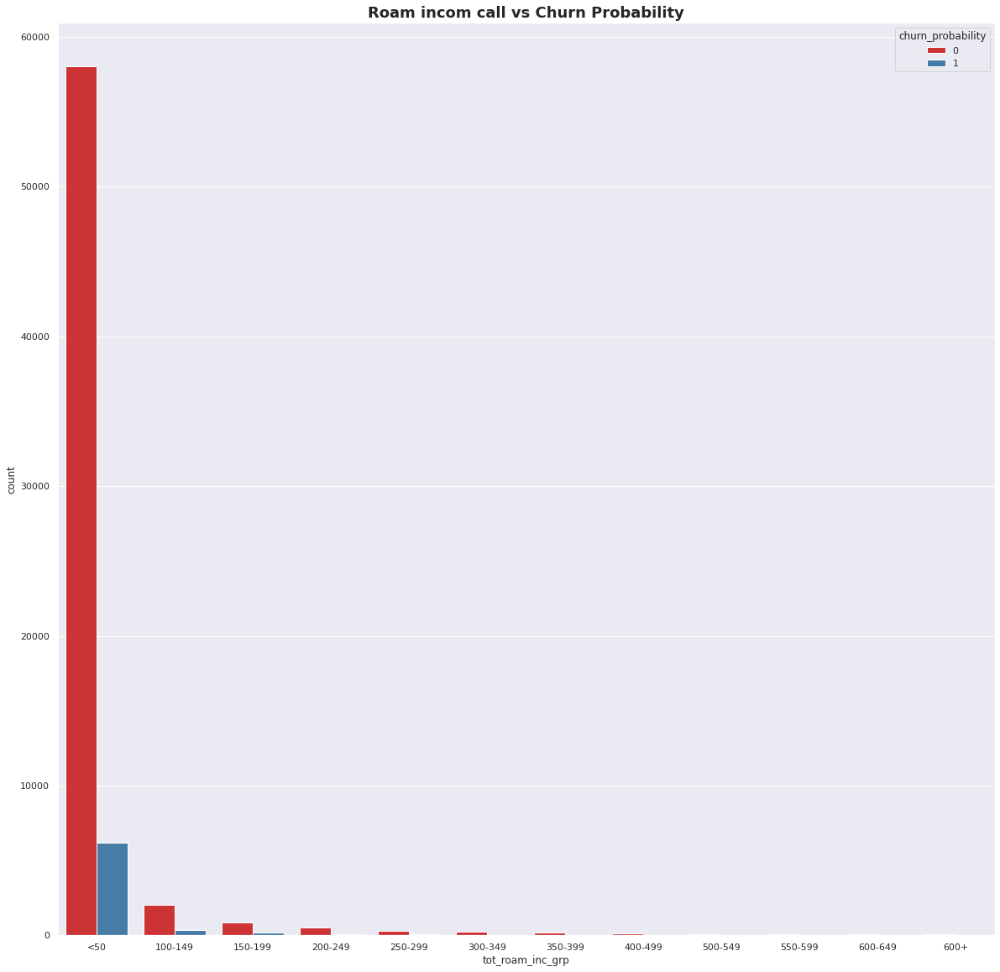

In [67]:
# Seperating columns for roam incomming call
tot_roam_in_call = [col for col in telecom_columns if 'roam_ic' in col]

# Sum of all the roam incomming column
telecom_EDA['total_roam_income'] = telecom_EDA[tot_roam_in_call].sum(axis = 1)

# Creating group for roam incomming column
telecom_EDA['tot_roam_inc_grp'] = pd.cut(telecom_EDA['total_roam_income'],[0,50,100,150,200,250,300,350,400,450,500,550,600],labels=['<50','100-149','150-199','200-249','250-299','300-349','350-399','400-499','500-549','550-599','600-649','600+'], include_lowest=True)

fig,ax =plt.subplots(figsize=(20,20))
sns.countplot(data = telecom_EDA,x = 'tot_roam_inc_grp', hue='churn_probability',palette='Set1')
plt.title('Roam incom call vs Churn Probability',fontsize=18,fontweight="bold")

__Observation__
- Customers who have roaming income call **<50 are leaving the network**. 
- Also we can see that there are large number of customers who receive roaming income call in the same range and continue to use the same network.

### What is the roaming outgoing call pattern for customers based on churning?

Text(0.5, 1.0, 'Roam outgoing call vs Churn Probability')

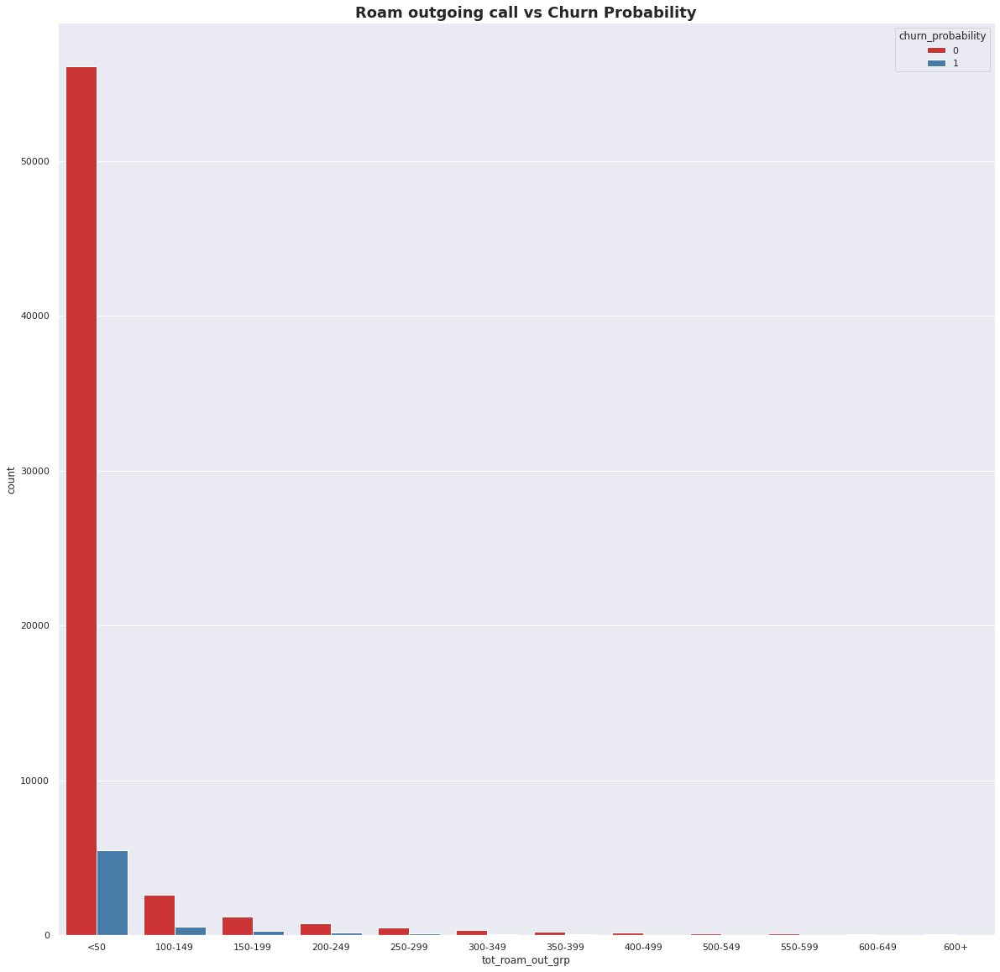

In [68]:
# Seperating columns for roam outgoing
tot_roam_out_call = [col for col in telecom_columns if 'roam_og' in col]

# Sum of all the roam outgoing column
telecom_EDA['total_roam_outgoing'] = telecom_EDA[tot_roam_out_call].sum(axis = 1)

# Creating group for roam outgoing column
telecom_EDA['tot_roam_out_grp'] = pd.cut(telecom_EDA['total_roam_outgoing'],[0,50,100,150,200,250,300,350,400,450,500,550,600],labels=['<50','100-149','150-199','200-249','250-299','300-349','350-399','400-499','500-549','550-599','600-649','600+'], include_lowest=True)

fig,ax =plt.subplots(figsize=(20,20))
sns.countplot(data = telecom_EDA,x = 'tot_roam_out_grp', hue='churn_probability',palette='Set1')
plt.title('Roam outgoing call vs Churn Probability',fontsize=18,fontweight="bold")

__Obervation__
- From the plot we could see that customers **who does less than 50 roaming outgoing** tend to churn more than others.

### How is the churning of customers based on local outgoing for every month?

Text(0.5, 1.0, 'Local outgoing vs Churn Probability')

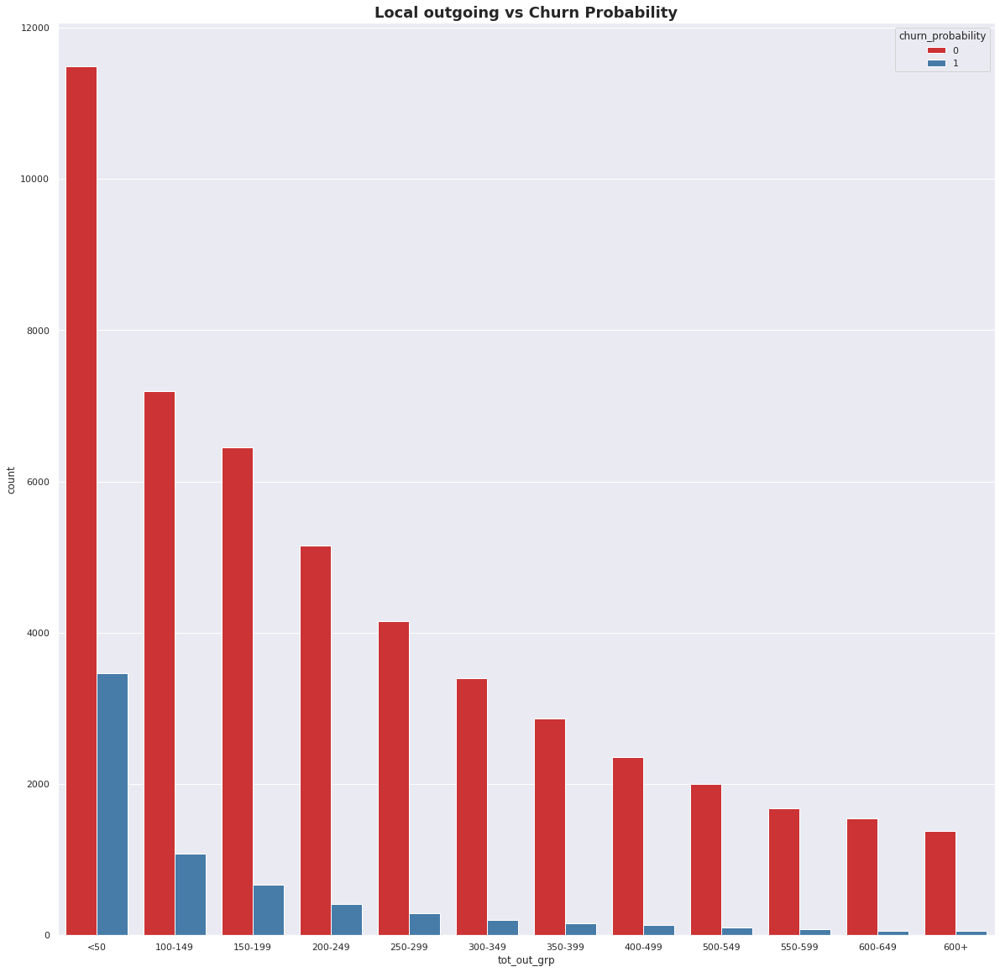

In [69]:
# Seperating columns for local outgoing
tot_out_call = [col for col in telecom_columns if 'loc_og_mou_' in col]

# Sum of all the local outgoing column
telecom_EDA['total_local_outgoing'] = telecom_EDA[tot_out_call].sum(axis = 1)

# Creating group for local outgoing column
telecom_EDA['tot_out_grp'] = pd.cut(telecom_EDA['total_local_outgoing'],[0,50,100,150,200,250,300,350,400,450,500,550,600],labels=['<50','100-149','150-199','200-249','250-299','300-349','350-399','400-499','500-549','550-599','600-649','600+'], include_lowest=True)

fig,ax =plt.subplots(figsize=(20,20))
sns.countplot(data = telecom_EDA,x = 'tot_out_grp', hue='churn_probability',palette='Set1')
plt.title('Local outgoing vs Churn Probability',fontsize=18,fontweight="bold")

__Observation__
- Customers tend to **churn if total local outgoing is <50**.
- Followed by customers who has **churned with total  local outgoing between 100-149**.
- There is **less churning of customers with total local outgoing call greater than 300**.

### How is the churning of customers based on total outgoing call for every month?

Text(0.5, 1.0, 'Toal outgoing call vs Churn Probability')

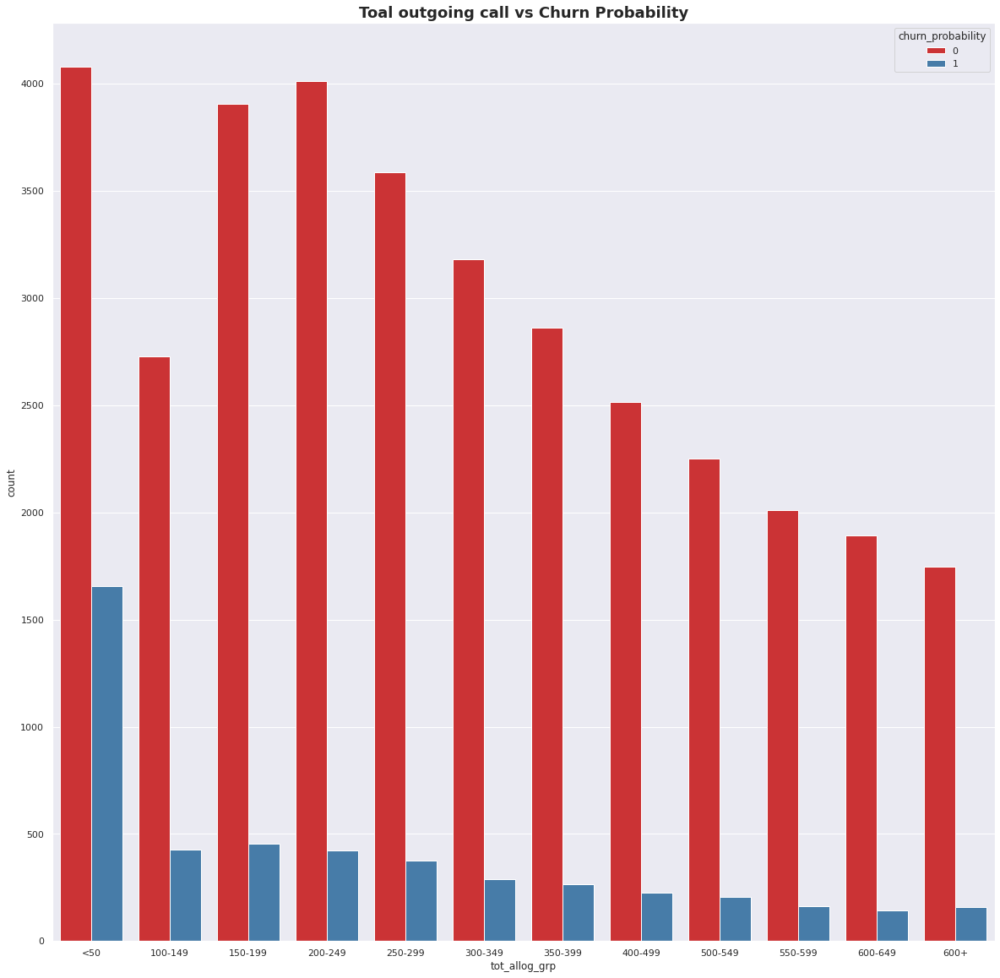

In [70]:
# Seperating columns for total outgoing
tot_allog_call = [col for col in telecom_columns if 'total_og_mou_' in col]

# Sum of all the total outgoing column
telecom_EDA['total_all_outgoing'] = telecom_EDA[tot_allog_call].sum(axis = 1)

# Creating group for total outgoing column
telecom_EDA['tot_allog_grp'] = pd.cut(telecom_EDA['total_all_outgoing'],[0,50,100,150,200,250,300,350,400,450,500,550,600],labels=['<50','100-149','150-199','200-249','250-299','300-349','350-399','400-499','500-549','550-599','600-649','600+'], include_lowest=True)

fig,ax =plt.subplots(figsize=(20,20))
sns.countplot(data = telecom_EDA,x = 'tot_allog_grp', hue='churn_probability',palette='Set1')
plt.title('Toal outgoing call vs Churn Probability',fontsize=18,fontweight="bold")


__Observation__

- Count of customers who **retain in the network** are high who make total **outgoig call <50, and between 150 to 250  outgoing calls**.
- **Churning of customers** are also **high who make total outgoing call <50**.

### How is the churning of customers based on total incomming call for every month?

Text(0.5, 1.0, 'Toal incoming call vs Churn Probability')

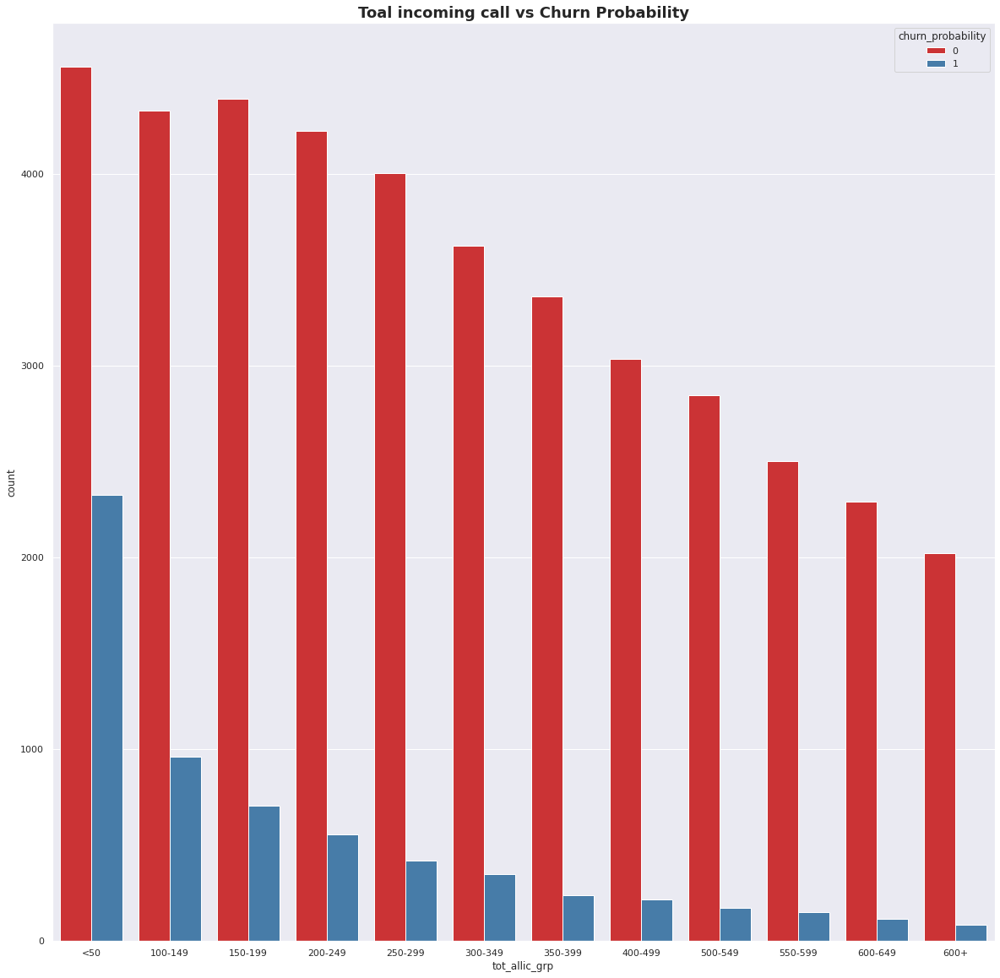

In [71]:
# Seperating columns for total outgoing
tot_allic_call = [col for col in telecom_columns if 'total_ic_mou_' in col]

# Sum of all the total outgoing column
telecom_EDA['total_all_incoming'] = telecom_EDA[tot_allic_call].sum(axis = 1)

# Creating group for total outgoing column
telecom_EDA['tot_allic_grp'] = pd.cut(telecom_EDA['total_all_incoming'],[0,50,100,150,200,250,300,350,400,450,500,550,600],labels=['<50','100-149','150-199','200-249','250-299','300-349','350-399','400-499','500-549','550-599','600-649','600+'], include_lowest=True)

fig,ax =plt.subplots(figsize=(20,20))
sns.countplot(data = telecom_EDA,x = 'tot_allic_grp', hue='churn_probability',palette='Set1')
plt.title('Toal incoming call vs Churn Probability',fontsize=18,fontweight="bold")

__Observation__
- Customers are **leaving the network**, if the total **incoming call is less than 150**.
- Also, few customers leave the network even the incoming call is above 600 calls.

In [72]:
tot_allog_call

['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']

In [73]:
train_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 138 columns):
 #    Column                Dtype   
---   ------                -----   
 0    id                    int64   
 1    arpu_6                float64 
 2    arpu_7                float64 
 3    arpu_8                float64 
 4    roam_ic_mou_6         float64 
 5    roam_ic_mou_7         float64 
 6    roam_ic_mou_8         float64 
 7    roam_og_mou_6         float64 
 8    roam_og_mou_7         float64 
 9    roam_og_mou_8         float64 
 10   loc_og_t2t_mou_6      float64 
 11   loc_og_t2t_mou_7      float64 
 12   loc_og_t2t_mou_8      float64 
 13   loc_og_t2m_mou_6      float64 
 14   loc_og_t2m_mou_7      float64 
 15   loc_og_t2m_mou_8      float64 
 16   loc_og_t2f_mou_6      float64 
 17   loc_og_t2f_mou_7      float64 
 18   loc_og_t2f_mou_8      float64 
 19   loc_og_t2c_mou_6      float64 
 20   loc_og_t2c_mou_7      float64 
 21   loc_og_t2c_mou_8      float64 
 2

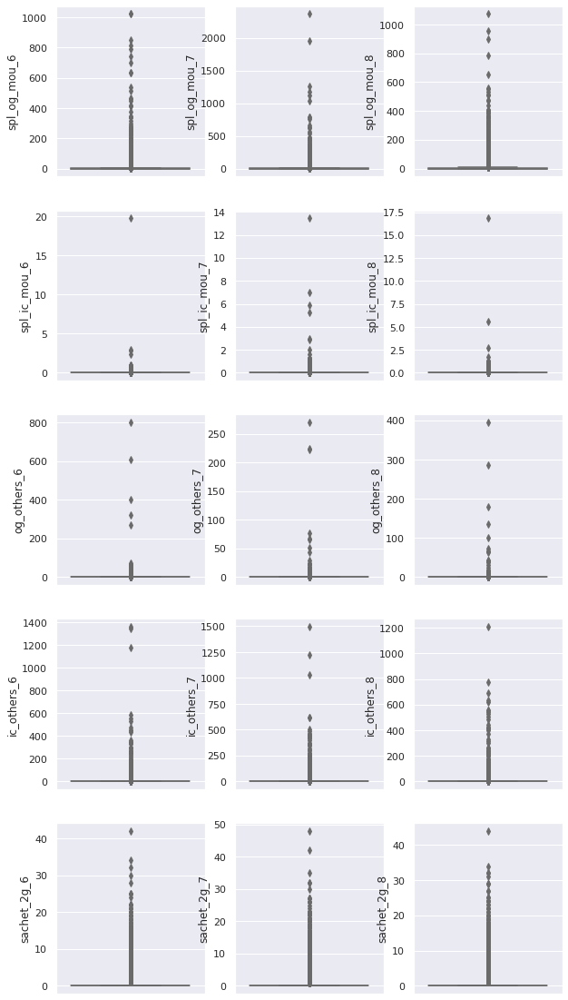

In [74]:
# Check the outliers in all the numeric columns

plt.figure(figsize=(10, 20))
plt.subplot(5,3,1)
sns.boxplot(y = 'spl_og_mou_6', palette='Set3', data = train_data)
plt.subplot(5,3,2)
sns.boxplot(y = 'spl_og_mou_7', palette='Set3', data = train_data)
plt.subplot(5,3,3)
sns.boxplot(y = 'spl_og_mou_8', palette='Set3', data = train_data)
plt.subplot(5,3,4)
sns.boxplot(y = 'spl_ic_mou_6', palette='Set3', data = train_data)
plt.subplot(5,3,5)
sns.boxplot(y = 'spl_ic_mou_7', palette='Set3', data = train_data)
plt.subplot(5,3,6)
sns.boxplot(y = 'spl_ic_mou_8', palette='Set3', data = train_data)
plt.subplot(5,3,7)
sns.boxplot(y = 'og_others_6', palette='Set3', data = train_data)
plt.subplot(5,3,8)
sns.boxplot(y = 'og_others_7', palette='Set3', data = train_data)
plt.subplot(5,3,9)
sns.boxplot(y = 'og_others_8', palette='Set3', data = train_data)
plt.subplot(5,3,10)
sns.boxplot(y = 'ic_others_6', palette='Set3', data = train_data)
plt.subplot(5,3,11)
sns.boxplot(y = 'ic_others_7', palette='Set3', data = train_data)
plt.subplot(5,3,12)
sns.boxplot(y = 'ic_others_8', palette='Set3', data = train_data)
plt.subplot(5,3,13)
sns.boxplot(y = 'sachet_2g_6', palette='Set3', data = train_data)
plt.subplot(5,3,14)
sns.boxplot(y = 'sachet_2g_7', palette='Set3', data = train_data)
plt.subplot(5,3,15)
sns.boxplot(y = 'sachet_2g_8', palette='Set3', data = train_data)
plt.show()

### Removing "id" column and the columns that were created to perform EDA from the dataset

In [75]:
train_data.drop(['id','total_recharge','total_roam_income','total_roam_outgoing','total_local_outgoing','total_all_outgoing','total_all_incoming'], axis = 1, inplace = True)

In [76]:
train_data.drop(['rech_group','aon_group','tot_roam_inc_grp','tot_roam_out_grp','tot_out_grp','tot_allog_grp','tot_allic_grp'], axis = 1, inplace = True)

In [77]:
train_data.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,174.25,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,0.00,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,16.46,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,8.89,0.28,2.81,95.11,50.18,83.84,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,160,240,130,110,110,50,110,110,50,0,0,0

In [79]:
train_data.columns.tolist()

['arpu_6',
 'arpu_7',
 'arpu_8',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2f_mou_6',
 'std_og_t2f_mou_7',
 'std_og_t2f_mou_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_og_mou_6',
 'std_og_mou_7',
 'std_og_mou_8',
 'isd_og_mou_6',
 'isd_og_mou_7',
 'isd_og_mou_8',
 'spl_og_mou_6',
 'spl_og_mou_7',
 'spl_og_mou_8',
 'og_others_6',
 'og_others_7',
 'og_others_8',
 'total_og_mou_6',
 'total_og_mou_7',
 'total_og_mou_8',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2t_mou_7',
 'lo

In [80]:
# displays the shape of our dataset
rows , columns = train_data.shape 
print("After treating missing values our dataset has %s rows and %s columns" % (rows, columns))

After treating missing values our dataset has 69999 rows and 124 columns


In [81]:
train_data.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,174.25,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,0.00,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,16.46,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,8.89,0.28,2.81,95.11,50.18,83.84,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,160,240,130,110,110,50,110,110,50,0,0,0

## Removing highly correlated features

In [82]:
telecom_num = train_data.select_dtypes(include=['int64','float64'])
telecom_num.head(4)

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.0,0.0,0.0,0.0,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.0,0.0,0.0,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.0,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,174.25,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.4,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.00,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.0,0.0,0.0,0.0,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.0,0.0,0.0,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.0,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,120,0,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,16.46,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.0,0.0,0.0,0.0,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.0,0.0,0.0,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,0.0,76.03,95.98,53.84,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.0,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,8.89,0.28,2.81,95.11,50.18,83.84,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,160,240,130,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,23.27,197.47,0.00,0.00,0.0


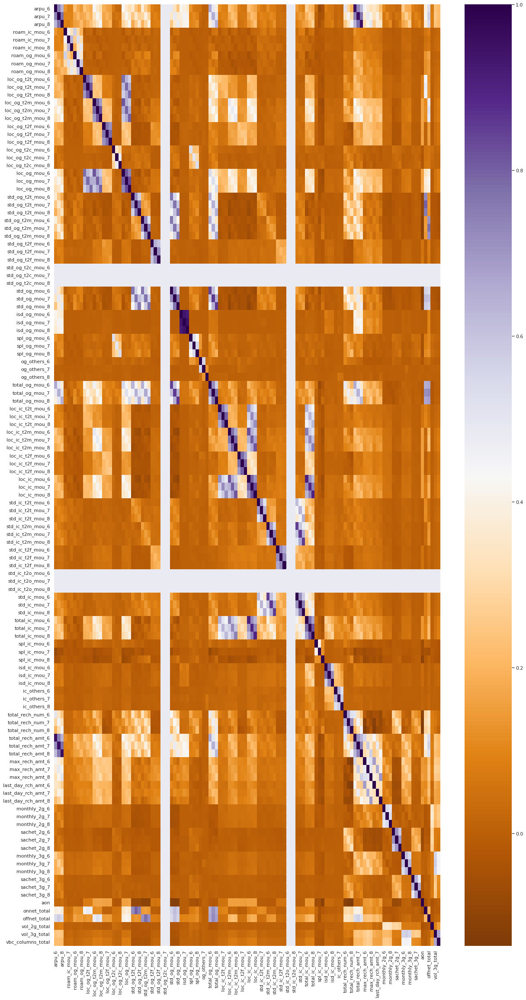

In [83]:
plt.subplots(figsize = (20,40))
corr_matrix=telecom_num.corr()
# plot it
sns.heatmap(corr_matrix, cmap='PuOr')

In [84]:
cor_matrix = telecom_num.corr().abs()
print(cor_matrix)

                      arpu_6    arpu_7    arpu_8  roam_ic_mou_6  roam_ic_mou_7  roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  loc_og_t2t_mou_6  loc_og_t2t_mou_7  loc_og_t2t_mou_8  loc_og_t2m_mou_6  loc_og_t2m_mou_7  loc_og_t2m_mou_8  loc_og_t2f_mou_6  loc_og_t2f_mou_7  loc_og_t2f_mou_8  loc_og_t2c_mou_6  loc_og_t2c_mou_7  loc_og_t2c_mou_8  loc_og_mou_6  loc_og_mou_7  loc_og_mou_8  std_og_t2t_mou_6  std_og_t2t_mou_7  std_og_t2t_mou_8  std_og_t2m_mou_6  std_og_t2m_mou_7  std_og_t2m_mou_8  std_og_t2f_mou_6  std_og_t2f_mou_7  std_og_t2f_mou_8  std_og_t2c_mou_6  std_og_t2c_mou_7  std_og_t2c_mou_8  std_og_mou_6  std_og_mou_7  std_og_mou_8  isd_og_mou_6  isd_og_mou_7  isd_og_mou_8  spl_og_mou_6  spl_og_mou_7  spl_og_mou_8  og_others_6  og_others_7  og_others_8  total_og_mou_6  total_og_mou_7  total_og_mou_8  loc_ic_t2t_mou_6  loc_ic_t2t_mou_7  loc_ic_t2t_mou_8  loc_ic_t2m_mou_6  loc_ic_t2m_mou_7  loc_ic_t2m_mou_8  loc_ic_t2f_mou_6  loc_ic_t2f_mou_7  loc_ic_t2f_mou_8  \
arpu_6   

In [85]:
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
print(upper_tri)

                    arpu_6   arpu_7    arpu_8  roam_ic_mou_6  roam_ic_mou_7  roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  loc_og_t2t_mou_6  loc_og_t2t_mou_7  loc_og_t2t_mou_8  loc_og_t2m_mou_6  loc_og_t2m_mou_7  loc_og_t2m_mou_8  loc_og_t2f_mou_6  loc_og_t2f_mou_7  loc_og_t2f_mou_8  loc_og_t2c_mou_6  loc_og_t2c_mou_7  loc_og_t2c_mou_8  loc_og_mou_6  loc_og_mou_7  loc_og_mou_8  std_og_t2t_mou_6  std_og_t2t_mou_7  std_og_t2t_mou_8  std_og_t2m_mou_6  std_og_t2m_mou_7  std_og_t2m_mou_8  std_og_t2f_mou_6  std_og_t2f_mou_7  std_og_t2f_mou_8  std_og_t2c_mou_6  std_og_t2c_mou_7  std_og_t2c_mou_8  std_og_mou_6  std_og_mou_7  std_og_mou_8  isd_og_mou_6  isd_og_mou_7  isd_og_mou_8  spl_og_mou_6  spl_og_mou_7  spl_og_mou_8  og_others_6  og_others_7  og_others_8  total_og_mou_6  total_og_mou_7  total_og_mou_8  loc_ic_t2t_mou_6  loc_ic_t2t_mou_7  loc_ic_t2t_mou_8  loc_ic_t2m_mou_6  loc_ic_t2m_mou_7  loc_ic_t2m_mou_8  loc_ic_t2f_mou_6  loc_ic_t2f_mou_7  loc_ic_t2f_mou_8  \
arpu_6      

In [86]:
coerr_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.80)]
print(coerr_drop)

['loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'onnet_total']


In [87]:
train_data.drop(['loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6','total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7','std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8','onnet_total'], axis = 1, inplace = True)

In [88]:
train_data.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,5.29,16.04,0.00,0.00,0.00,0.00,0.00,0.00,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,8.20,0.63,0.00,0.38,0.0,0.0,2.43,3.68,0.83,21.08,16.91,0.00,0.00,0.00,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,30.73,31.66,0.00,0.0,0.0,1.68,19.09,1.41,18.68,11.09,0.35,1.66,3.40,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,24.11,0.00,0.00,0.00,0.00,2.14,0.00,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,2.89,1.38,0.00,0.00,0.0,0.0,4.51,6.16,89.86,25.18,23.51,0.00,0.00,0.00,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,37.91,44.89,0.00,0.00,0.00,0.00,0.00,8.03,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,14.95,9.13,25.61,0.00,0.0,0.0,24.98,4.84,53.99,44.23,57.14,7.23,0.81,0.00,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,0,1,1,1,197.47,0.00,0.00,0.0
4,240.708,128.191,101.565,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,36.74,19.88,11.99,1.23,5.01,0.00,9.85,0.00,0.00,0.00,0.00,4.35,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.00,17.00,0.00,0.00,0.0,0.0,5.44,1.39,10.58,4.33,19.49,5.51,3.63,6.14,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,13,10,8,50,41,30,25,10,30,0,0,0,7,6,6,0,0,0,0,1,0,647,0,1,1,1,104.73,913.16,0.00,0.0


In [89]:
df_train = train_data
df_train.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 100 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   arpu_6                69999 non-null  float64
 1   arpu_7                69999 non-null  float64
 2   arpu_8                69999 non-null  float64
 3   roam_ic_mou_6         69999 non-null  float64
 4   roam_ic_mou_7         69999 non-null  float64
 5   roam_ic_mou_8         69999 non-null  float64
 6   roam_og_mou_6         69999 non-null  float64
 7   roam_og_mou_7         69999 non-null  float64
 8   roam_og_mou_8         69999 non-null  float64
 9   loc_og_t2t_mou_6      69999 non-null  float64
 10  loc_og_t2t_mou_7      69999 non-null  float64
 11  loc_og_t2m_mou_6      69999 non-null  float64
 12  loc_og_t2m_mou_7      69999 non-null  float64
 13  loc_og_t2f_mou_6      69999 non-null  float64
 14  loc_og_t2f_mou_7      69999 non-null  float64
 15  loc_og_t2f_mou_8  

## Importing Test dataset  

In [90]:
# apply scaling on the dataset
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

In [ ]:
import io
test_data = pd.read_csv('/kaggle/input/telecom-churn-case-study-hackathon-C39/test (1).csv')

In [91]:
from google.colab import files
data_to_load = files.upload()

Saving test.csv to test.csv


In [92]:
import io
test_data = pd.read_csv(io.BytesIO(data_to_load['test.csv']))

In [93]:
#For displaying maximum rows and columns
test_data.head(10)
pd.set_option('display.max_rows', 500) 
pd.set_option('display.max_columns', 500) 
pd.set_option('display.width', 1000)

In [94]:
test_data.head(6)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

### Calculating number of rows and columns in data

In [95]:
# displays the shape of our dataset
rows , columns = test_data.shape
print("Dataset has %s rows and %s columns" % (rows, columns))

Dataset has 30000 rows and 171 columns


In [96]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Columns: 171 entries, id to jun_vbc_3g
dtypes: float64(135), int64(27), object(9)
memory usage: 39.1+ MB


In [97]:
test_data.describe() 

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,30000.000000,30000.0,29684.0,29684.0,29684.0,30000.000000,30000.000000,30000.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.0,28828.0,28325.0,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,30000.000000,30000.000000,30000.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.0,28828.0,28325.0,28831.000000,28828.000000,28325.000000,30000.000000,30000.000000,30000.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.

### Finding columns having maximum unique value

In [98]:
#Selecting categorical fields from the data
test_telecom_category_features = test_data.select_dtypes(include=['object'])
test_telecom_category_features.head(4)

,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8
0,6/30/2014,7/31/2014,8/31/2014,6/21/2014,7/26/2014,8/24/2014,NaN,NaN,NaN
1,6/30/2014,7/31/2014,8/31/2014,6/19/2014,7/16/2014,8/24/2014,NaN,NaN,NaN
2,6/30/2014,7/31/2014,8/31/2014,6/29/2014,7/27/2014,8/28/2014,NaN,NaN,NaN
3,6/30/2014,7/31/2014,8/31/2014,6/25/2014,7/30/2014,8/24/2014,NaN,NaN,NaN


In [99]:
#Selecting numeric fields from the data
test_telecom_numeric_feature = test_data.select_dtypes(include=['int64','float64'])
test_telecom_numeric_feature.head(4)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.9,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.0,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.0,0.00,0.0,0.36,1.04,4.34,0.0,0.0,0.0,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.0,5,5,4,103,90,60,50,30,30,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.0,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.0,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.0,0.00,0.0,0.00,12.51,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.0,5,4,5,500,500,500,250,250,250,250,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,2533,0.00,0.00,0.00
2,70001,109,0.0,0.0,0.0,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00

In [100]:
# Frequently occuring single value from categorical columns
def telecom_occurance(test_telecom_category_features):
    test_data_occur = []
    for i in test_telecom_category_features.columns:
        occurance_count = test_telecom_category_features[i].value_counts()
        count_total = occurance_count.iloc[0]
        if count_total / len(test_telecom_category_features) * 100 > 98:
            test_data_occur.append(i)
    test_data_occur = list(test_data_occur)
    return test_data_occur

In [101]:
telecom_occurance(test_telecom_category_features)

['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8']

In [102]:
# Frequently occuring single value from numerical columns
def telecom_occurance(test_telecom_numeric_feature):
    test_tele_occur = []
    for i in test_telecom_numeric_feature.columns:
        occurance_count = test_telecom_numeric_feature[i].value_counts()
        count_total = occurance_count.iloc[0]
        if count_total / len(test_telecom_numeric_feature) * 100 > 98:
            test_tele_occur.append(i)
    test_tele_occur = list(test_tele_occur)
    return test_tele_occur

In [103]:
telecom_occurance(test_telecom_numeric_feature)

['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou']

### Finding Duplicate rows in data

In [104]:
# Checking for Duplicate entries in dataset
row, column = test_data[test_data.duplicated()].shape
print('There is no duplicate records in our dataset.' if row==0 else f'There are {row} duplicates in the dataset.')

There is no duplicate records in our dataset.


In [105]:
rows , columns = test_data.shape # displays the shape of our dataset
print("Before treating missing values our dataset has %s rows and %s columns" % (rows, columns))

Before treating missing values our dataset has 30000 rows and 171 columns


### Calculating missing values of the features

In [106]:
# Finding percentage of missing values
test_percent_missing_value = print(round(test_data.isnull().sum()/len(test_data.index)*100,2).sort_values(ascending=False))

arpu_3g_6                   74.72
count_rech_3g_6             74.72
fb_user_6                   74.72
night_pck_user_6            74.72
total_rech_data_6           74.72
max_rech_data_6             74.72
count_rech_2g_6             74.72
date_of_last_rech_data_6    74.72
av_rech_amt_data_6          74.72
arpu_2g_6                   74.72
night_pck_user_7            74.31
arpu_2g_7                   74.31
fb_user_7                   74.31
arpu_3g_7                   74.31
count_rech_2g_7             74.31
av_rech_amt_data_7          74.31
max_rech_data_7             74.31
count_rech_3g_7             74.31
total_rech_data_7           74.31
date_of_last_rech_data_7    74.31
night_pck_user_8            73.59
arpu_3g_8                   73.59
arpu_2g_8                   73.59
count_rech_3g_8             73.59
total_rech_data_8           73.59
av_rech_amt_data_8          73.59
max_rech_data_8             73.59
fb_user_8                   73.59
count_rech_2g_8             73.59
date_of_last_r

In [107]:
# Droping columns which has 70% missing values
test_data = test_data[test_data.columns[test_data.isnull().mean() < 0.7]]

In [108]:
# Finding percentage of missing values
test_percent_missing_value = print(round(test_data.isnull().sum()/len(test_data.index)*100,2).sort_values(ascending=False))

loc_ic_t2m_mou_8        5.58
loc_og_t2t_mou_8        5.58
loc_og_t2f_mou_8        5.58
loc_og_t2c_mou_8        5.58
loc_og_mou_8            5.58
std_og_t2t_mou_8        5.58
std_og_t2m_mou_8        5.58
std_og_t2f_mou_8        5.58
std_og_t2c_mou_8        5.58
std_og_mou_8            5.58
isd_og_mou_8            5.58
og_others_8             5.58
loc_ic_t2t_mou_8        5.58
loc_ic_t2f_mou_8        5.58
loc_ic_mou_8            5.58
std_ic_t2t_mou_8        5.58
std_ic_t2m_mou_8        5.58
std_ic_t2f_mou_8        5.58
std_ic_t2o_mou_8        5.58
std_ic_mou_8            5.58
spl_ic_mou_8            5.58
isd_ic_mou_8            5.58
ic_others_8             5.58
loc_og_t2m_mou_8        5.58
spl_og_mou_8            5.58
onnet_mou_8             5.58
roam_ic_mou_8           5.58
roam_og_mou_8           5.58
offnet_mou_8            5.58
std_og_mou_7            3.91
std_ic_t2o_mou_7        3.91
loc_ic_t2m_mou_7        3.91
std_og_t2c_mou_7        3.91
std_ic_t2f_mou_7        3.91
offnet_mou_7  

## Missing value treatment

- **Replacing missing values of the data frame with zero**, as it depends on the nature of the features and target variable and we are concerned about the churning of customers. So, the values could not be replaced with mean value. 

In [109]:
# Replace missing values with 0
test_data = test_data.replace(np.nan,0)

In [110]:
test_data.isnull().sum()

id                      0
circle_id               0
loc_og_t2o_mou          0
std_og_t2o_mou          0
loc_ic_t2o_mou          0
last_date_of_month_6    0
last_date_of_month_7    0
last_date_of_month_8    0
arpu_6                  0
arpu_7                  0
arpu_8                  0
onnet_mou_6             0
onnet_mou_7             0
onnet_mou_8             0
offnet_mou_6            0
offnet_mou_7            0
offnet_mou_8            0
roam_ic_mou_6           0
roam_ic_mou_7           0
roam_ic_mou_8           0
roam_og_mou_6           0
roam_og_mou_7           0
roam_og_mou_8           0
loc_og_t2t_mou_6        0
loc_og_t2t_mou_7        0
loc_og_t2t_mou_8        0
loc_og_t2m_mou_6        0
loc_og_t2m_mou_7        0
loc_og_t2m_mou_8        0
loc_og_t2f_mou_6        0
loc_og_t2f_mou_7        0
loc_og_t2f_mou_8        0
loc_og_t2c_mou_6        0
loc_og_t2c_mou_7        0
loc_og_t2c_mou_8        0
loc_og_mou_6            0
loc_og_mou_7            0
loc_og_mou_8            0
std_og_t2t_m

In [111]:
# Finding percentage of missing values
test_percent_missing_value = print(round(test_data.isnull().sum()/len(test_data.index)*100,2).sort_values(ascending=False))

id                      0.0
spl_ic_mou_8            0.0
std_ic_mou_8            0.0
total_ic_mou_6          0.0
total_ic_mou_7          0.0
total_ic_mou_8          0.0
spl_ic_mou_6            0.0
spl_ic_mou_7            0.0
isd_ic_mou_6            0.0
std_ic_mou_6            0.0
isd_ic_mou_7            0.0
isd_ic_mou_8            0.0
ic_others_6             0.0
ic_others_7             0.0
ic_others_8             0.0
total_rech_num_6        0.0
std_ic_mou_7            0.0
std_ic_t2o_mou_8        0.0
loc_ic_t2f_mou_6        0.0
std_ic_t2t_mou_8        0.0
loc_ic_t2f_mou_8        0.0
loc_ic_mou_6            0.0
loc_ic_mou_7            0.0
loc_ic_mou_8            0.0
std_ic_t2t_mou_6        0.0
std_ic_t2t_mou_7        0.0
std_ic_t2m_mou_6        0.0
std_ic_t2o_mou_7        0.0
std_ic_t2m_mou_7        0.0
std_ic_t2m_mou_8        0.0
std_ic_t2f_mou_6        0.0
std_ic_t2f_mou_7        0.0
std_ic_t2f_mou_8        0.0
std_ic_t2o_mou_6        0.0
total_rech_num_7        0.0
total_rech_num_8    

In [112]:
test_data.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,30000.000000,30000.0,30000.0,30000.0,30000.0,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.0,30000.0,30000.0,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.00000,30000.000000,30000.000000,30000.0,30000.0,30000.0,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,84998.500000,109.0,0.0,0.0,0.0,282.644348,279.355021,279.845167,125.539490,127.946958,125.679297,188.117924,189.104353,185.668382,9.975940,7.174221,7.522428,12.752706,9.382512,9.857337,45.704440,45.345183,43.771460,89.937606,89.168060,88.032484,3.622405,3.680604,3.508741,1.072640,1.331749,1.382451,139.271455,138.200916,135.319580,74.949845,78.

In [114]:
# display number of records in dataset
len(test_data.index)

30000

In [116]:
# displays the shape of our dataset
rows , columns = test_data.shape 
print("After treating missing values our dataset has %s rows and %s columns" % (rows, columns))

After treating missing values our dataset has 30000 rows and 141 columns


In [117]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Columns: 141 entries, id to jun_vbc_3g
dtypes: float64(108), int64(27), object(6)
memory usage: 32.3+ MB


## Feature Engineering
Separating **Date** from **date_of_last_rech_6, date_of_last_rech_7 and date_of_last_rech_8**

In [118]:
test_data[["rech_month_june", "rech_date_june2014", "rech_year_june"]] = test_data["date_of_last_rech_6"].str.split("/", expand = True)
test_data[["rech_month_july", "rech_date_july2014", "rech_year_july"]] = test_data["date_of_last_rech_7"].str.split("/", expand = True)
test_data[["rech_month_august", "rech_date_august2014", "rech_year_august"]] = test_data["date_of_last_rech_8"].str.split("/", expand = True)
test_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,rech_month_june,rech_date_june2014,rech_year_june,rech_month_july,rech_date_july2014,rech_year_july,rech_month_august,rech_date_august2014,rech_year_august
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,6,21,2014,7,26,2014,8,24,2014
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,6,19,2014,7,16,2014,8,24,2014
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00

In [119]:
test_data.drop(['rech_month_june','rech_month_july','rech_month_august','rech_year_june','rech_year_july','rech_year_august'], axis = 1, inplace = True)
test_data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis = 1, inplace = True)
test_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,rech_date_june2014,rech_date_july2014,rech_date_august2014
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,21,26,24
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,19,16,24
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0

In [120]:
test_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,rech_date_june2014,rech_date_july2014,rech_date_august2014
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,21,26,24
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,19,16,24
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0

In [121]:
test_data.isnull().sum()

id                         0
circle_id                  0
loc_og_t2o_mou             0
std_og_t2o_mou             0
loc_ic_t2o_mou             0
last_date_of_month_6       0
last_date_of_month_7       0
last_date_of_month_8       0
arpu_6                     0
arpu_7                     0
arpu_8                     0
onnet_mou_6                0
onnet_mou_7                0
onnet_mou_8                0
offnet_mou_6               0
offnet_mou_7               0
offnet_mou_8               0
roam_ic_mou_6              0
roam_ic_mou_7              0
roam_ic_mou_8              0
roam_og_mou_6              0
roam_og_mou_7              0
roam_og_mou_8              0
loc_og_t2t_mou_6           0
loc_og_t2t_mou_7           0
loc_og_t2t_mou_8           0
loc_og_t2m_mou_6           0
loc_og_t2m_mou_7           0
loc_og_t2m_mou_8           0
loc_og_t2f_mou_6           0
loc_og_t2f_mou_7           0
loc_og_t2f_mou_8           0
loc_og_t2c_mou_6           0
loc_og_t2c_mou_7           0
loc_og_t2c_mou

In [122]:
# Replace missing values with 0
test_data = test_data.replace(np.nan,0)

In [123]:
test_data.isnull().sum()

id                      0
circle_id               0
loc_og_t2o_mou          0
std_og_t2o_mou          0
loc_ic_t2o_mou          0
last_date_of_month_6    0
last_date_of_month_7    0
last_date_of_month_8    0
arpu_6                  0
arpu_7                  0
arpu_8                  0
onnet_mou_6             0
onnet_mou_7             0
onnet_mou_8             0
offnet_mou_6            0
offnet_mou_7            0
offnet_mou_8            0
roam_ic_mou_6           0
roam_ic_mou_7           0
roam_ic_mou_8           0
roam_og_mou_6           0
roam_og_mou_7           0
roam_og_mou_8           0
loc_og_t2t_mou_6        0
loc_og_t2t_mou_7        0
loc_og_t2t_mou_8        0
loc_og_t2m_mou_6        0
loc_og_t2m_mou_7        0
loc_og_t2m_mou_8        0
loc_og_t2f_mou_6        0
loc_og_t2f_mou_7        0
loc_og_t2f_mou_8        0
loc_og_t2c_mou_6        0
loc_og_t2c_mou_7        0
loc_og_t2c_mou_8        0
loc_og_mou_6            0
loc_og_mou_7            0
loc_og_mou_8            0
std_og_t2t_m

__Observation__
- Our test dataset has no missing values.

### Converting rech_date_june2014, rech_date_july2014 ,rech_date_august2014 to integer type to perform calculations.

In [124]:
test_data['rech_date_june2014'] = test_data['rech_date_june2014'].astype(int)   # using astype() to convert datatype
test_data['rech_date_july2014'] = test_data['rech_date_july2014'].astype(int)
test_data['rech_date_august2014'] = test_data['rech_date_august2014'].astype(int)  

In [125]:
# Replace values of columns by using DataFrame.loc[] property.
test_data.loc[test_data['rech_date_june2014'] > 1, 'rech_date_june2014'] = 1
test_data.loc[test_data['rech_date_july2014'] > 1, 'rech_date_july2014'] = 1
test_data.loc[test_data['rech_date_august2014'] > 1, 'rech_date_august2014'] = 1

In [126]:
# Converting datatype of features to object
test_data['rech_date_june2014'] = test_data['rech_date_june2014'].astype(str)
test_data['rech_date_july2014'] = test_data['rech_date_july2014'].astype(str)
test_data['rech_date_august2014'] = test_data['rech_date_august2014'].astype(str)

In [127]:
test_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,rech_date_june2014,rech_date_july2014,rech_date_august2014
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,1,1,1
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,1,1,1
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0

In [128]:
test_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 141 columns):
 #    Column                Dtype  
---   ------                -----  
 0    id                    int64  
 1    circle_id             int64  
 2    loc_og_t2o_mou        float64
 3    std_og_t2o_mou        float64
 4    loc_ic_t2o_mou        float64
 5    last_date_of_month_6  object 
 6    last_date_of_month_7  object 
 7    last_date_of_month_8  object 
 8    arpu_6                float64
 9    arpu_7                float64
 10   arpu_8                float64
 11   onnet_mou_6           float64
 12   onnet_mou_7           float64
 13   onnet_mou_8           float64
 14   offnet_mou_6          float64
 15   offnet_mou_7          float64
 16   offnet_mou_8          float64
 17   roam_ic_mou_6         float64
 18   roam_ic_mou_7         float64
 19   roam_ic_mou_8         float64
 20   roam_og_mou_6         float64
 21   roam_og_mou_7         float64
 22   roam_og_mou_8       

### Calculating total Onnet(All kind of calls within the same operator network) and total offnet(All kind of calls outside the operator T network)

In [129]:
test_telecom_columns = test_data.columns.tolist()

In [130]:
# Seperating columns for onnet and offnet
onnet_columns = [col for col in test_telecom_columns if 'onnet' in col]
offnet_columns = [col for col in test_telecom_columns if 'offnet' in col]

# Sum of all the onnet and offnet columns
test_data['onnet_total'] = test_data[onnet_columns].sum(axis = 1)
test_data['offnet_total'] = test_data[offnet_columns].sum(axis = 1)

# Seperating vol_2g and vol_3g columns
vol_2g_columns = [col for col in test_telecom_columns if 'vol' in col and '2g' in col]
vol_3g_columns = [col for col in test_telecom_columns if 'vol' in col and '3g' in col]

# Sum of all vol_2g and vol_3g
test_data['vol_2g_total'] = test_data[vol_2g_columns].sum(axis = 1)
test_data['vol_3g_total'] = test_data[vol_3g_columns].sum(axis = 1)

# Separating vbc columns
vbc_columns = [col for col in test_telecom_columns if 'vbc' in col]

# Sum of all vbc columns
test_data['vbc_columns_total'] = test_data[vbc_columns].sum(axis = 1)

In [131]:
test_data.drop(['onnet_mou_6','onnet_mou_7','onnet_mou_8','offnet_mou_6','offnet_mou_7','offnet_mou_8','vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8','aug_vbc_3g','jul_vbc_3g','jun_vbc_3g'], axis = 1, inplace = True)

In [132]:
test_data.head(5)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,onnet_total,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0,0,0,0,0,0,0,0,0,0,0,0,1692,1,1,1,75.12,127.15,0.0,0.0,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2533,1,1,1,136.56,1491.12,0.0,0.0,0.00
2,70001,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,329.844,434.884,746.239,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,277,1,1,1,23.80,107.83,0.0,0.0,1525.86
3,70002,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,43.550,171.390,24.400,0.00,0.00,0.00,0.00,0.00,0.00,5.31,0.00,0.00,2.94,98.61,20.51,0.00,0.00,2.35,0.0,6.18,0.00,8.26,98.61,22.86,0.00,2.

In [133]:
test_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 131 columns):
 #    Column                Dtype  
---   ------                -----  
 0    id                    int64  
 1    circle_id             int64  
 2    loc_og_t2o_mou        float64
 3    std_og_t2o_mou        float64
 4    loc_ic_t2o_mou        float64
 5    last_date_of_month_6  object 
 6    last_date_of_month_7  object 
 7    last_date_of_month_8  object 
 8    arpu_6                float64
 9    arpu_7                float64
 10   arpu_8                float64
 11   roam_ic_mou_6         float64
 12   roam_ic_mou_7         float64
 13   roam_ic_mou_8         float64
 14   roam_og_mou_6         float64
 15   roam_og_mou_7         float64
 16   roam_og_mou_8         float64
 17   loc_og_t2t_mou_6      float64
 18   loc_og_t2t_mou_7      float64
 19   loc_og_t2t_mou_8      float64
 20   loc_og_t2m_mou_6      float64
 21   loc_og_t2m_mou_7      float64
 22   loc_og_t2m_mou_8    

In [134]:
test_data.drop(['id'], axis = 1, inplace = True)

In [135]:
# displays the shape of our dataset
rows , columns = test_data.shape 
print("After treating missing values our dataset has %s rows and %s columns" % (rows, columns))

After treating missing values our dataset has 30000 rows and 130 columns


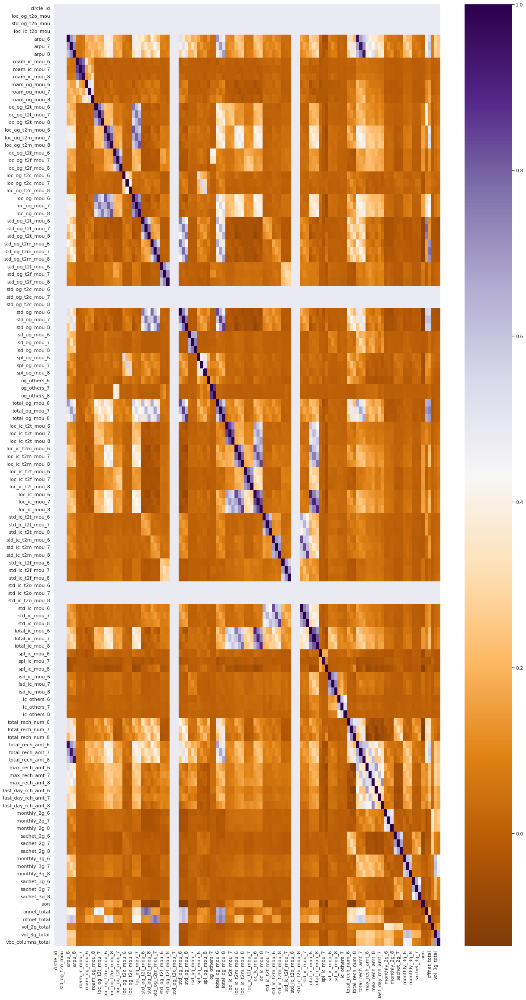

In [136]:
    plt.subplots(figsize = (20,40))
    corr_matrix=test_data.corr()
    # plot it
    sns.heatmap(corr_matrix, cmap='PuOr')

## Removing highly correlated features

In [137]:
cor_matrix = test_data.corr().abs()
print(cor_matrix)

                    circle_id  loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou    arpu_6    arpu_7    arpu_8  roam_ic_mou_6  roam_ic_mou_7  roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  loc_og_t2t_mou_6  loc_og_t2t_mou_7  loc_og_t2t_mou_8  loc_og_t2m_mou_6  loc_og_t2m_mou_7  loc_og_t2m_mou_8  loc_og_t2f_mou_6  loc_og_t2f_mou_7  loc_og_t2f_mou_8  loc_og_t2c_mou_6  loc_og_t2c_mou_7  loc_og_t2c_mou_8  loc_og_mou_6  loc_og_mou_7  loc_og_mou_8  std_og_t2t_mou_6  std_og_t2t_mou_7  std_og_t2t_mou_8  std_og_t2m_mou_6  std_og_t2m_mou_7  std_og_t2m_mou_8  std_og_t2f_mou_6  std_og_t2f_mou_7  std_og_t2f_mou_8  std_og_t2c_mou_6  std_og_t2c_mou_7  std_og_t2c_mou_8  std_og_mou_6  std_og_mou_7  std_og_mou_8  isd_og_mou_6  isd_og_mou_7  isd_og_mou_8  spl_og_mou_6  spl_og_mou_7  spl_og_mou_8  og_others_6  og_others_7  og_others_8  total_og_mou_6  total_og_mou_7  total_og_mou_8  loc_ic_t2t_mou_6  loc_ic_t2t_mou_7  loc_ic_t2t_mou_8  loc_ic_t2m_mou_6  loc_ic_t2m_mou_7  loc_ic_t2m_mou_8  \
circ

In [138]:
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
print(upper_tri)

                    circle_id  loc_og_t2o_mou  std_og_t2o_mou  loc_ic_t2o_mou  arpu_6    arpu_7    arpu_8  roam_ic_mou_6  roam_ic_mou_7  roam_ic_mou_8  roam_og_mou_6  roam_og_mou_7  roam_og_mou_8  loc_og_t2t_mou_6  loc_og_t2t_mou_7  loc_og_t2t_mou_8  loc_og_t2m_mou_6  loc_og_t2m_mou_7  loc_og_t2m_mou_8  loc_og_t2f_mou_6  loc_og_t2f_mou_7  loc_og_t2f_mou_8  loc_og_t2c_mou_6  loc_og_t2c_mou_7  loc_og_t2c_mou_8  loc_og_mou_6  loc_og_mou_7  loc_og_mou_8  std_og_t2t_mou_6  std_og_t2t_mou_7  std_og_t2t_mou_8  std_og_t2m_mou_6  std_og_t2m_mou_7  std_og_t2m_mou_8  std_og_t2f_mou_6  std_og_t2f_mou_7  std_og_t2f_mou_8  std_og_t2c_mou_6  std_og_t2c_mou_7  std_og_t2c_mou_8  std_og_mou_6  std_og_mou_7  std_og_mou_8  isd_og_mou_6  isd_og_mou_7  isd_og_mou_8  spl_og_mou_6  spl_og_mou_7  spl_og_mou_8  og_others_6  og_others_7  og_others_8  total_og_mou_6  total_og_mou_7  total_og_mou_8  loc_ic_t2t_mou_6  loc_ic_t2t_mou_7  loc_ic_t2t_mou_8  loc_ic_t2m_mou_6  loc_ic_t2m_mou_7  loc_ic_t2m_mou_8  \
circle

In [139]:
test_data.drop(['last_date_of_month_6','last_date_of_month_7','last_date_of_month_8','circle_id','loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou',
                'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'isd_og_mou_7', 'isd_og_mou_8', 'total_og_mou_6',
                'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7',
                'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8','onnet_total'], axis = 1, inplace = True)

In [140]:
test_data.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,91.882,65.330,64.445,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,18.13,10.89,0.00,13.58,0.00,0.0,0.00,0.03,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.00,0.00,0.03,0.0,0.0,0.0,30.33,37.56,10.21,4.59,9.53,0.26,0.00,0.00,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,50,30,30,30,30,0,0,0,0,0,0,0,0,0,0,0,0,0,1692,1,1,1,127.15,0.0,0.0,0.00
1,414.168,515.568,360.868,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,473.61,598.08,0.73,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.00,0.00,0.00,0.0,0.0,0.0,19.99,26.95,160.19,122.29,184.81,1.49,0.00,0.00,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,250,250,250,250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2533,1,1,1,1491.12,0.0,0.0,0.00
2,329.844,434.884,746.239,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,300,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,277,1,1,1,107.83,0.0,0.0,1525.86
3,43.550,171.390,24.400,0.00,0.00,0.00,0.00,0.00,0.00,5.31,0.00,2.94,98.61,0.00,0.00,2.35,0.0,6.18,0.00,0.00,2.16,0.00,37.09,94.36,0.00,0.0,0.0,0.0,0.0,0.0,0.0,37.09,96.53,0.00,0.0,0.00,12.03,1.15,0.0,0.0,0.0,58.11,54.64,487.94,449.83,506.94,0.00,0.38,1.64,0.00,4.26,0.00,9.63,11.88,8.83,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,1.43,8.65,0.0,0.0,0.00,3,5,2,110,150,0,110,150,0,0,0,0,0,0,0,0,0,0,0,0,0,1244,1,1,1,269.06,0.0,0.0,0.00
4,306.854,406.289,413.329,0.00,0.00,0.00,0.00,0.00,0.00,0.45,0.78,2.39,2.66,0.00,0.00,0.00,0.0,0.00,0.00,450.48,608.24,686.11,58.54,21.18,63.18,0.0,0.0,0.0,0.0,0.0,0.0,509.03,629.43,749.29,0.0,0.71,5.39,4.96,2.2,0.0,0.0,0.00,0.36,10.13,9.23,7.69,0.00,0.00,0.00,29.71,92.36,107.39,13.88,13.96,32.46,0.0,0.0,1.61,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.16,11,7,8,90,130,130,50,130,130,0,0,0,0,0,0,0,0,0,0,0,0,462,1,1,1,158.94,0.0,0.0,0.00


In [141]:
test_data.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 99 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   arpu_6                30000 non-null  float64
 1   arpu_7                30000 non-null  float64
 2   arpu_8                30000 non-null  float64
 3   roam_ic_mou_6         30000 non-null  float64
 4   roam_ic_mou_7         30000 non-null  float64
 5   roam_ic_mou_8         30000 non-null  float64
 6   roam_og_mou_6         30000 non-null  float64
 7   roam_og_mou_7         30000 non-null  float64
 8   roam_og_mou_8         30000 non-null  float64
 9   loc_og_t2t_mou_6      30000 non-null  float64
 10  loc_og_t2t_mou_7      30000 non-null  float64
 11  loc_og_t2m_mou_6      30000 non-null  float64
 12  loc_og_t2m_mou_7      30000 non-null  float64
 13  loc_og_t2f_mou_6      30000 non-null  float64
 14  loc_og_t2f_mou_7      30000 non-null  float64
 15  loc_og_t2f_mou_8   

In [142]:
df_test = test_data
df_test.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 99 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   arpu_6                30000 non-null  float64
 1   arpu_7                30000 non-null  float64
 2   arpu_8                30000 non-null  float64
 3   roam_ic_mou_6         30000 non-null  float64
 4   roam_ic_mou_7         30000 non-null  float64
 5   roam_ic_mou_8         30000 non-null  float64
 6   roam_og_mou_6         30000 non-null  float64
 7   roam_og_mou_7         30000 non-null  float64
 8   roam_og_mou_8         30000 non-null  float64
 9   loc_og_t2t_mou_6      30000 non-null  float64
 10  loc_og_t2t_mou_7      30000 non-null  float64
 11  loc_og_t2m_mou_6      30000 non-null  float64
 12  loc_og_t2m_mou_7      30000 non-null  float64
 13  loc_og_t2f_mou_6      30000 non-null  float64
 14  loc_og_t2f_mou_7      30000 non-null  float64
 15  loc_og_t2f_mou_8   

In [145]:
df_test.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,91.882,65.330,64.445,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,18.13,10.89,0.00,13.58,0.00,0.0,0.00,0.03,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.00,0.00,0.03,0.0,0.0,0.0,30.33,37.56,10.21,4.59,9.53,0.26,0.00,0.00,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,50,30,30,30,30,0,0,0,0,0,0,0,0,0,0,0,0,0,1692,1,1,1,127.15,0.0,0.0,0.00
1,414.168,515.568,360.868,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,473.61,598.08,0.73,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.00,0.00,0.00,0.0,0.0,0.0,19.99,26.95,160.19,122.29,184.81,1.49,0.00,0.00,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,250,250,250,250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2533,1,1,1,1491.12,0.0,0.0,0.00
2,329.844,434.884,746.239,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,300,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,277,1,1,1,107.83,0.0,0.0,1525.86
3,43.550,171.390,24.400,0.00,0.00,0.00,0.00,0.00,0.00,5.31,0.00,2.94,98.61,0.00,0.00,2.35,0.0,6.18,0.00,0.00,2.16,0.00,37.09,94.36,0.00,0.0,0.0,0.0,0.0,0.0,0.0,37.09,96.53,0.00,0.0,0.00,12.03,1.15,0.0,0.0,0.0,58.11,54.64,487.94,449.83,506.94,0.00,0.38,1.64,0.00,4.26,0.00,9.63,11.88,8.83,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,1.43,8.65,0.0,0.0,0.00,3,5,2,110,150,0,110,150,0,0,0,0,0,0,0,0,0,0,0,0,0,1244,1,1,1,269.06,0.0,0.0,0.00
4,306.854,406.289,413.329,0.00,0.00,0.00,0.00,0.00,0.00,0.45,0.78,2.39,2.66,0.00,0.00,0.00,0.0,0.00,0.00,450.48,608.24,686.11,58.54,21.18,63.18,0.0,0.0,0.0,0.0,0.0,0.0,509.03,629.43,749.29,0.0,0.71,5.39,4.96,2.2,0.0,0.0,0.00,0.36,10.13,9.23,7.69,0.00,0.00,0.00,29.71,92.36,107.39,13.88,13.96,32.46,0.0,0.0,1.61,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.16,11,7,8,90,130,130,50,130,130,0,0,0,0,0,0,0,0,0,0,0,0,462,1,1,1,158.94,0.0,0.0,0.00


In [146]:
df_train.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,churn_probability,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,5.29,16.04,0.00,0.00,0.00,0.00,0.00,0.00,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,8.20,0.63,0.00,0.38,0.0,0.0,2.43,3.68,0.83,21.08,16.91,0.00,0.00,0.00,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0,1,1,1,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,30.73,31.66,0.00,0.0,0.0,1.68,19.09,1.41,18.68,11.09,0.35,1.66,3.40,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0,1,1,1,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,24.11,0.00,0.00,0.00,0.00,2.14,0.00,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,2.89,1.38,0.00,0.00,0.0,0.0,4.51,6.16,89.86,25.18,23.51,0.00,0.00,0.00,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0,1,1,1,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,37.91,44.89,0.00,0.00,0.00,0.00,0.00,8.03,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,14.95,9.13,25.61,0.00,0.0,0.0,24.98,4.84,53.99,44.23,57.14,7.23,0.81,0.00,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,0,1,1,1,197.47,0.00,0.00,0.0
4,240.708,128.191,101.565,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,36.74,19.88,11.99,1.23,5.01,0.00,9.85,0.00,0.00,0.00,0.00,4.35,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.00,17.00,0.00,0.00,0.0,0.0,5.44,1.39,10.58,4.33,19.49,5.51,3.63,6.14,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,13,10,8,50,41,30,25,10,30,0,0,0,7,6,6,0,0,0,0,1,0,647,0,1,1,1,104.73,913.16,0.00,0.0


In [147]:
df_test['churn_probability'] = ''

In [148]:
df_test.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total,churn_probability
0,91.882,65.330,64.445,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,18.13,10.89,0.00,13.58,0.00,0.0,0.00,0.03,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.00,0.00,0.03,0.0,0.0,0.0,30.33,37.56,10.21,4.59,9.53,0.26,0.00,0.00,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,50,30,30,30,30,0,0,0,0,0,0,0,0,0,0,0,0,0,1692,1,1,1,127.15,0.0,0.0,0.00,
1,414.168,515.568,360.868,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,473.61,598.08,0.73,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.00,0.00,0.00,0.0,0.0,0.0,19.99,26.95,160.19,122.29,184.81,1.49,0.00,0.00,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,250,250,250,250,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2533,1,1,1,1491.12,0.0,0.0,0.00,
2,329.844,434.884,746.239,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,300,500,500,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,277,1,1,1,107.83,0.0,0.0,1525.86,
3,43.550,171.390,24.400,0.00,0.00,0.00,0.00,0.00,0.00,5.31,0.00,2.94,98.61,0.00,0.00,2.35,0.0,6.18,0.00,0.00,2.16,0.00,37.09,94.36,0.00,0.0,0.0,0.0,0.0,0.0,0.0,37.09,96.53,0.00,0.0,0.00,12.03,1.15,0.0,0.0,0.0,58.11,54.64,487.94,449.83,506.94,0.00,0.38,1.64,0.00,4.26,0.00,9.63,11.88,8.83,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,1.43,8.65,0.0,0.0,0.00,3,5,2,110,150,0,110,150,0,0,0,0,0,0,0,0,0,0,0,0,0,1244,1,1,1,269.06,0.0,0.0,0.00,
4,306.854,406.289,413.329,0.00,0.00,0.00,0.00,0.00,0.00,0.45,0.78,2.39,2.66,0.00,0.00,0.00,0.0,0.00,0.00,450.48,608.24,686.11,58.54,21.18,63.18,0.0,0.0,0.0,0.0,0.0,0.0,509.03,629.43,749.29,0.0,0.71,5.39,4.96,2.2,0.0,0.0,0.00,0.36,10.13,9.23,7.69,0.00,0.00,0.00,29.71,92.36,107.39,13.88,13.96,32.46,0.0,0.0,1.61,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.16,11,7,8,90,130,130,50,130,130,0,0,0,0,0,0,0,0,0,0,0,0,462,1,1,1,158.94,0.0,0.0,0.00,


## Splitting into X_train and y_train on training dataset

In [149]:
y_train = df_train.pop('churn_probability')               #y_train
X_train = df_train 

In [150]:
print(X_train.shape)
print(y_train.shape)

(69999, 99)
(69999,)


In [151]:
y_train.head()

0    0
1    0
2    0
3    0
4    0
Name: churn_probability, dtype: object

## Splitting into X_test and y_test on test dataset

In [152]:
y_test = df_test.pop('churn_probability')               #y_train
X_test = df_test

In [153]:
print(X_test.shape)
print(y_test.shape)

(30000, 99)
(30000,)


In [154]:
y_test.head()

0    
1    
2    
3    
4    
Name: churn_probability, dtype: object

### PCA

In [155]:
X_train_pca =X_train

In [156]:
#Import PCA
from sklearn.decomposition import PCA

In [157]:
# Instantiate PCA
pca = PCA(random_state=42)

In [158]:
# Fit train set on PCA
pca.fit(X_train_pca)

PCA(random_state=42)

In [159]:
pca.components_

array([[ 6.06999477e-02,  6.57748907e-02,  6.37362504e-02, ...,
         3.89205929e-02,  9.35582856e-01,  3.28365509e-01],
       [ 1.77329242e-01,  2.00521956e-01,  1.90445649e-01, ...,
        -6.47322807e-03, -5.50734224e-02, -1.60101935e-02],
       [ 4.95586614e-02,  5.28978875e-02,  5.51840539e-02, ...,
        -2.93019442e-02, -1.53588828e-02,  1.53116420e-02],
       ...,
       [ 0.00000000e+00,  1.80187550e-17, -1.37071431e-17, ...,
        -2.77555756e-17, -1.38777878e-17, -6.93889390e-18],
       [-0.00000000e+00, -5.32320993e-18,  1.97424137e-17, ...,
        -0.00000000e+00, -2.77555756e-17, -0.00000000e+00],
       [ 0.00000000e+00, -5.09575021e-18,  1.86632382e-17, ...,
         1.04083409e-17, -3.46944695e-18,  1.04083409e-17]])

In [160]:
# Explained variance ratio for each component
pca.explained_variance_ratio_

array([4.02817012e-01, 1.93667104e-01, 1.48388651e-01, 5.10186782e-02,
       4.62474431e-02, 3.63462086e-02, 2.82941350e-02, 2.01097326e-02,
       1.12905373e-02, 8.52085105e-03, 6.61317714e-03, 6.07484842e-03,
       4.27342950e-03, 4.11919389e-03, 4.04673969e-03, 3.77493807e-03,
       2.55189678e-03, 2.46236526e-03, 1.82603826e-03, 1.76071777e-03,
       1.59293524e-03, 1.46031306e-03, 1.44250743e-03, 1.39362193e-03,
       9.27402616e-04, 8.63066523e-04, 7.53950183e-04, 7.10924222e-04,
       6.79230462e-04, 5.96718313e-04, 5.85556717e-04, 5.07825664e-04,
       4.97795014e-04, 4.86718070e-04, 4.70510707e-04, 4.35564371e-04,
       3.01414993e-04, 2.58841273e-04, 2.47523364e-04, 2.27259839e-04,
       2.04946457e-04, 1.80244192e-04, 1.22065070e-04, 1.11005039e-04,
       1.03392657e-04, 9.81358341e-05, 9.38408001e-05, 7.14071604e-05,
       6.66289460e-05, 4.78857659e-05, 4.59708888e-05, 3.55811503e-05,
       2.69831945e-05, 2.61083863e-05, 2.36928701e-05, 1.34420580e-05,
      

### Making scree plot for explained variance

In [161]:
# Cumuliative varinace of the PCs
variance_cumu = np.cumsum(pca.explained_variance_ratio_)
print(variance_cumu)

[0.40281701 0.59648412 0.74487277 0.79589145 0.84213889 0.8784851
 0.90677923 0.92688896 0.9381795  0.94670035 0.95331353 0.95938838
 0.96366181 0.967781   0.97182774 0.97560268 0.97815458 0.98061694
 0.98244298 0.9842037  0.98579663 0.98725695 0.98869945 0.99009308
 0.99102048 0.99188354 0.99263749 0.99334842 0.99402765 0.99462437
 0.99520992 0.99571775 0.99621555 0.99670226 0.99717277 0.99760834
 0.99790975 0.99816859 0.99841612 0.99864338 0.99884832 0.99902857
 0.99915063 0.99926164 0.99936503 0.99946317 0.99955701 0.99962842
 0.99969504 0.99974293 0.9997889  0.99982448 0.99985147 0.99987757
 0.99990127 0.99991471 0.99992513 0.99993534 0.99994534 0.99995456
 0.99996306 0.99997061 0.99997599 0.99998127 0.99998492 0.99998847
 0.99999141 0.99999421 0.99999643 0.99999771 0.99999847 0.99999921
 0.9999995  0.99999964 0.99999976 0.99999986 0.99999989 0.99999992
 0.99999994 0.99999995 0.99999996 0.99999997 0.99999997 0.99999998
 0.99999999 0.99999999 0.99999999 1.         1.         1.
 1. 

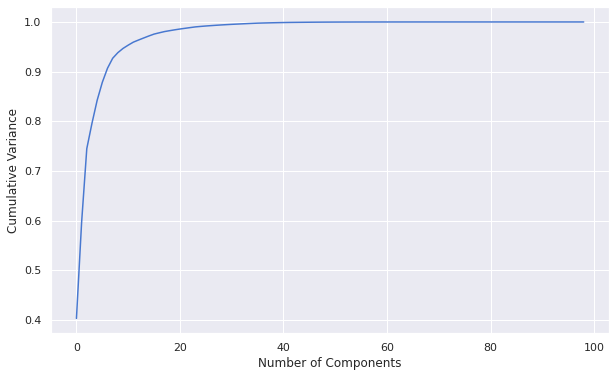

In [162]:
# Plotting scree plot
fig = plt.figure(figsize = (10,6))
plt.plot(variance_cumu)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')
plt.show()

### Perform PCA with selected component

In [163]:
# Importing incremental PCA
from sklearn.decomposition import IncrementalPCA

In [164]:
# Instantiate PCA with 99 components
pca_final = IncrementalPCA(n_components=99)

In [165]:
# Fit and transform the X_train
df_train_pca = pca_final.fit_transform(X_train_pca)

In [166]:
df_train_pca.shape

(69999, 99)

In [167]:
corrmat = np.corrcoef(df_train_pca.transpose())

In [168]:
corrmat.shape

(99, 99)

### Applying Logistic Regression on Principal Component

In [169]:
# Copying y_train to new pca y_train
y_train_pca = y_train

In [178]:
from sklearn.linear_model import LogisticRegression
learner_pca = LogisticRegression()                      
learner_pca.fit(df_train_pca, y_train_pca)     # apply logistic regression to pca traindata

LogisticRegression()

In [173]:
#predict y_pred_train
y_pred_train_pca = learner_pca.predict(df_train_pca)  

In [175]:
# copying X_test to pca X_test
X_test_pca = X_test

In [176]:
# predict y_pred_test
y_pred_test_pca = learner_pca.predict(X_test_pca)   

In [177]:
y_predicted_pca = y_pred_test_pca.tolist()
y_predicted_pca

['0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0'

In [179]:
# writing predicted output to dataframe
df_pca = pd.DataFrame(y_predicted_pca,columns = ['churn_probability'])
df_pca

,churn_probability
0,0
1,0
2,0
3,0
4,1
...,...
29995,0
29996,0
29997,0
29998,1


In [180]:
df_pca.insert(0, 'id', range(69999, 69999 + len(df_pca)))
df_pca

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,1
...,...,...
29995,99994,0
29996,99995,0
29997,99996,0
29998,99997,1


## Applying Logistic Regression directly on the data

In [181]:
X_train_logreg = X_train

In [182]:
X_train_logreg.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,5.29,16.04,0.00,0.00,0.00,0.00,0.00,0.00,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,8.20,0.63,0.00,0.38,0.0,0.0,2.43,3.68,0.83,21.08,16.91,0.00,0.00,0.00,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,1,1,1,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,30.73,31.66,0.00,0.0,0.0,1.68,19.09,1.41,18.68,11.09,0.35,1.66,3.40,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,1,1,1,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,24.11,0.00,0.00,0.00,0.00,2.14,0.00,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,2.89,1.38,0.00,0.00,0.0,0.0,4.51,6.16,89.86,25.18,23.51,0.00,0.00,0.00,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,1,1,1,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,37.91,44.89,0.00,0.00,0.00,0.00,0.00,8.03,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,14.95,9.13,25.61,0.00,0.0,0.0,24.98,4.84,53.99,44.23,57.14,7.23,0.81,0.00,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,1,1,1,197.47,0.00,0.00,0.0
4,240.708,128.191,101.565,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,36.74,19.88,11.99,1.23,5.01,0.00,9.85,0.00,0.00,0.00,0.00,4.35,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.00,17.00,0.00,0.00,0.0,0.0,5.44,1.39,10.58,4.33,19.49,5.51,3.63,6.14,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,13,10,8,50,41,30,25,10,30,0,0,0,7,6,6,0,0,0,0,1,0,647,1,1,1,104.73,913.16,0.00,0.0


In [183]:
y_train_logreg = y_train

In [184]:
X_test_logreg = X_test

In [185]:
y_test_logreg = y_test

In [186]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression()
logreg.fit(X_train_logreg,y_train_logreg)

LogisticRegression()

In [187]:
y_pred_train_logreg = logreg.predict(X_train_logreg)  

In [188]:
y_pred_test_logreg = logreg.predict(X_test_logreg)    

In [189]:
y_predicted_logistic = y_pred_test_logreg.tolist()
y_predicted_logistic

['0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0'

In [190]:
df_lr1 = pd.DataFrame(y_predicted_logistic,columns = ['churn_probability'])
df_lr1

,churn_probability
0,0
1,0
2,0
3,0
4,0
...,...
29995,0
29996,0
29997,0
29998,0


In [191]:
df_lr1.insert(0, 'id', range(69999, 69999 + len(df_lr1)))
df_lr1

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0
...,...,...
29995,99994,0
29996,99995,0
29997,99996,0
29998,99997,0


In [ ]:
#df_lr1.to_excel(r'C:\Users\VINODA VARSHINI\Documents\telecomchurnhack\logreg2.xlsx',index=False)

In [192]:
df_lr1

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0
...,...,...
29995,99994,0
29996,99995,0
29997,99996,0
29998,99997,0


### Model Evaluation for Logistic Regression using accuracy classification score

In [193]:
from sklearn.metrics import accuracy_score
print('Accuracy score for test data is:', accuracy_score(y_train_logreg,y_pred_train_logreg))

Accuracy score for test data is: 0.9119987428391834


### Model Evaluation for Logistic Regression using confusion matrix

In [204]:
from sklearn.metrics import confusion_matrix
confusion_matrix = pd.DataFrame(confusion_matrix(y_train_logreg, y_pred_train_logreg))
print(confusion_matrix)

       0     1
0  62188   679
1   5481  1651


In [205]:
confusionlr = metrics.confusion_matrix(y_train_logreg, y_pred_train_logreg)
confusionlr

array([[62188,   679],
       [ 5481,  1651]])

### Calculating metrics beyond Accuracy score

In [206]:
TP = confusionlr[1,1] # true positive 
TN = confusionlr[0,0] # true negatives
FP = confusionlr[0,1] # false positives
FN = confusionlr[1,0] # false negatives

In [207]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.231491867638811

In [208]:
# Let us calculate specificity
TN / float(TN+FP)

0.9891994209998887

In [209]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.010800579000111346


In [210]:
# Positive predictive value 
print (TP / float(TP+FP))

0.7085836909871245


In [211]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9190027930071377


 __Observation__
 - Actual and Predicted not churned customers are 62188
 - Actual and predicted churnedcustomers are 1651

## Feature Standardisation on continous variable

In [212]:
df_train.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,31.277,87.009,7.527,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,5.29,16.04,0.00,0.00,0.00,0.00,0.00,0.00,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,8.20,0.63,0.00,0.38,0.0,0.0,2.43,3.68,0.83,21.08,16.91,0.00,0.00,0.00,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,1,1,1,131.25,0.00,0.00,0.0
1,0.000,122.787,42.953,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,30.73,31.66,0.00,0.0,0.0,1.68,19.09,1.41,18.68,11.09,0.35,1.66,3.40,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,1,1,1,56.88,352.91,3.96,0.0
2,60.806,103.176,0.000,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,24.11,0.00,0.00,0.00,0.00,2.14,0.00,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,2.89,1.38,0.00,0.00,0.0,0.0,4.51,6.16,89.86,25.18,23.51,0.00,0.00,0.00,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,1,1,1,136.04,0.00,0.00,0.0
3,156.362,205.260,111.095,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,37.91,44.89,0.00,0.00,0.00,0.00,0.00,8.03,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,14.95,9.13,25.61,0.00,0.0,0.0,24.98,4.84,53.99,44.23,57.14,7.23,0.81,0.00,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,1,1,1,197.47,0.00,0.00,0.0
4,240.708,128.191,101.565,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,36.74,19.88,11.99,1.23,5.01,0.00,9.85,0.00,0.00,0.00,0.00,4.35,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.00,17.00,0.00,0.00,0.0,0.0,5.44,1.39,10.58,4.33,19.49,5.51,3.63,6.14,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,13,10,8,50,41,30,25,10,30,0,0,0,7,6,6,0,0,0,0,1,0,647,1,1,1,104.73,913.16,0.00,0.0


### Scaling on Train data

In [213]:
# apply scaling on the dataset
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [214]:
# Apply scaler() to numeric fields
num_vars = ['arpu_6','arpu_7','arpu_8','roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8',
            'loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8',
            'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6',
            'std_og_t2m_mou_7','std_og_t2m_mou_8']
# Apply ".fit_transform" in train set
df_train[num_vars] = scaler.fit_transform(df_train[num_vars])

In [215]:
df_train.head()

,arpu_6,arpu_7,arpu_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,rech_date_june2014,rech_date_july2014,rech_date_august2014,offnet_total,vol_2g_total,vol_3g_total,vbc_columns_total
0,-0.753587,-0.555159,-0.771000,-0.166712,-0.122882,-0.127584,-0.189100,-0.16486,-0.147081,-0.288861,-0.292072,-0.527142,-0.469293,-0.274990,-0.272577,-0.273350,-0.192049,-0.168550,-0.211097,-0.124120,0.167241,-0.299563,-0.262354,-0.028200,-0.325509,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,8.20,0.63,0.00,0.38,0.0,0.0,2.43,3.68,0.83,21.08,16.91,0.00,0.00,0.00,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,1,1,1,131.25,0.00,0.00,0.0
1,-0.847171,-0.451263,-0.670336,-0.166712,-0.122882,-0.127584,-0.189100,-0.16486,-0.147081,-0.303904,-0.292072,-0.560237,-0.574906,-0.274990,-0.272577,-0.273350,-0.192049,2.665935,4.462066,-0.309113,-0.307461,-0.303440,-0.336981,-0.334779,-0.325509,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,30.73,31.66,0.00,0.0,0.0,1.68,19.09,1.41,18.68,11.09,0.35,1.66,3.40,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,1,1,1,56.88,352.91,3.96,0.0
2,-0.665232,-0.508211,-0.792389,-0.166712,-0.122882,-0.127584,-0.189100,-0.16486,-0.147081,-0.300329,-0.206676,-0.409404,-0.574906,-0.274990,-0.272577,-0.273350,0.187965,-0.168550,-0.211097,-0.309113,-0.296240,-0.303440,-0.221796,-0.022724,-0.325509,0.00,0.0,0.0,0.0,0.0,0.0,28.94,84.99,0.00,0.0,2.89,1.38,0.00,0.00,0.0,0.0,4.51,6.16,89.86,25.18,23.51,0.00,0.00,0.00,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,1,1,1,136.04,0.00,0.00,0.0
3,-0.379318,-0.211770,-0.476708,-0.166712,-0.122882,-0.127584,-0.189100,-0.16486,-0.121176,-0.256750,-0.266151,-0.323070,-0.279334,-0.274990,-0.272577,-0.273350,-0.192049,-0.168550,1.048571,-0.308076,-0.261433,-0.303440,-0.275966,-0.236161,-0.308056,0.56,0.0,0.0,0.0,0.0,0.0,16.16,37.99,4.60,0.0,14.95,9.13,25.61,0.00,0.0,0.0,24.98,4.84,53.99,44.23,57.14,7.23,0.81,0.00,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,1,1,1,197.47,0.00,0.00,0.0
4,-0.126945,-0.435570,-0.503788,0.786712,-0.122882,-0.127584,0.029207,-0.16486,-0.147081,-0.235366,-0.260295,-0.330390,-0.444009,0.642111,-0.180268,0.121547,-0.192049,1.099950,-0.211097,-0.309113,-0.307461,-0.303440,-0.319667,-0.334779,-0.325509,0.00,0.0,0.0,0.0,0.0,0.0,4.35,0.00,0.00,0.0,0.00,17.00,0.00,0.00,0.0,0.0,5.44,1.39,10.58,4.33,19.49,5.51

In [216]:
X_train_scld = df_train

### Scaling on test data

In [217]:
# Applying scaling on 25 features
test_num_vars = ['arpu_6','arpu_7','arpu_8','roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','roam_og_mou_6','roam_og_mou_7','roam_og_mou_8',
            'loc_og_t2t_mou_6','loc_og_t2t_mou_7','loc_og_t2m_mou_6','loc_og_t2m_mou_7','loc_og_t2f_mou_6','loc_og_t2f_mou_7','loc_og_t2f_mou_8',
            'loc_og_t2c_mou_6','loc_og_t2c_mou_7','loc_og_t2c_mou_8','std_og_t2t_mou_6','std_og_t2t_mou_7','std_og_t2t_mou_8','std_og_t2m_mou_6',
            'std_og_t2m_mou_7','std_og_t2m_mou_8']
# Applying ".transform" in test data
df_test[test_num_vars] = scaler.transform(df_test[test_num_vars])

In [218]:
X_test_scld = df_train

## Applying Logistic Regression on Scaled Features

In [219]:
X_train_lr_scld = X_train_scld

In [220]:
y_train_lr_scld = y_train

In [221]:
X_test_lr_scld = X_test_scld

In [222]:
y_test_lr_scld = y_test

In [223]:
logreg_scld = LogisticRegression()
logreg_scld.fit(X_train_lr_scld,y_train_lr_scld)

LogisticRegression()

In [224]:
y_pred_train_logreg_scld = logreg.predict(X_train_lr_scld) 

In [225]:
y_pred_test_logreg_scld = logreg.predict(X_test_lr_scld) 

In [226]:
y_predicted_logistic_scld = y_pred_test_logreg_scld.tolist()
y_predicted_logistic_scld

['0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0'

In [227]:
df_lr2 = pd.DataFrame(y_predicted_logistic_scld,columns = ['churn_probability'])
df_lr2

,churn_probability
0,0
1,0
2,0
3,0
4,0
...,...
69994,0
69995,0
69996,0
69997,0


In [228]:
df_lr2.insert(0, 'id', range(69999, 69999 + len(df_lr2)))
df_lr2

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0
...,...,...
69994,139993,0
69995,139994,0
69996,139995,0
69997,139996,0


In [240]:
output_lr =pd.DataFrame(df_lr2)

In [241]:
output_lr

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0
...,...,...
69994,139993,0
69995,139994,0
69996,139995,0
69997,139996,0


In [242]:
output_lr.to_csv('submission_lrscld',index=False)

In [229]:
#df_lr2.to_excel(r'C:\Users\VINODA VARSHINI\Documents\telecomchurnhack\logreg2_scld.xlsx',index=False)

## Model Evaluation for Logistic Regression on Scaled Data

In [230]:
from sklearn.metrics import accuracy_score
print('Accuracy score for test data is:', accuracy_score(y_train_lr_scld,y_pred_train_logreg_scld))

Accuracy score for test data is: 0.8990557007957256


In [231]:
from sklearn.metrics import confusion_matrix
confusion_matrix = pd.DataFrame(confusion_matrix(y_train_lr_scld, y_pred_train_logreg_scld))
print(confusion_matrix)

       0   1
0  62835  32
1   7034  98


### Model Performance Beyond Accuracy Score


In [233]:
confusionlr_scld = metrics.confusion_matrix(y_train_lr_scld, y_pred_train_logreg_scld)
confusionlr_scld

array([[62835,    32],
       [ 7034,    98]])

In [234]:
TP = confusionlr_scld[1,1] # true positive 
TN = confusionlr_scld[0,0] # true negatives
FP = confusionlr_scld[0,1] # false positives
FN = confusionlr_scld[1,0] # false negatives

In [235]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.013740886146943354

In [236]:
# Let us calculate specificity
TN / float(TN+FP)

0.9994909889131023

In [237]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.0005090110868977365


In [238]:
# Positive predictive value 
print (TP / float(TP+FP))

0.7538461538461538


In [239]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8993258812921324


__Observation__

# IMPORTANT START WORK FROM HERE

## Applying Decision Tree on scaled features

In [ ]:
# importing decision tree libraries
from sklearn.tree import DecisionTreeClassifier

In [ ]:
!pip install six

In [ ]:
!pip install pydotplus

In [ ]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [ ]:
dt = DecisionTreeClassifier(max_depth=7)
dt.fit(X_train_scld, y_train)

DecisionTreeClassifier(max_depth=7)

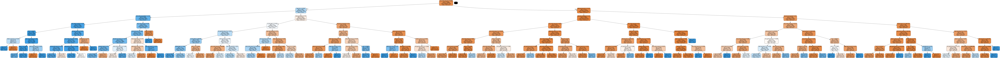

In [ ]:
# plotting tree with max_depth=7
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=df_train.columns, 
                class_names=['No Churn', "Churn"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)
#graph.write_pdf("dt_telecomchurn.pdf")

## Evaluation Model Performance for Decicion Tree




In [ ]:
y_train_pred_dt = dt.predict(X_train_scld)
y_test_pred_dt = dt.predict(X_test_scld)

In [ ]:
from sklearn.metrics import confusion_matrix,accuracy_score

In [ ]:
print(accuracy_score(y_train, y_train_pred_dt))
print(confusion_matrix(y_train, y_train_pred_dt))
print()

0.943984914070201
[[61369  1498]
 [ 2423  4709]]



In [ ]:
confusion_matrix.index = ['Actual not churn','Actual churned']
confusion_matrix.columns = ['Predicted not churn','Predicted churned']
print(confusion_matrix)

<function confusion_matrix at 0x7f7f56229cb0>


In [ ]:
print('Accuracy score for train data using decision tree is:',accuracy_score(y_train, y_train_pred_dt))

Accuracy score for train data using decision tree is: 0.943984914070201


In [ ]:
y_test_pred_dt

array(['0', '0', '0', ..., '0', '0', '0'], dtype=object)

In [ ]:
y_predicted_dt = y_test_pred_dt.tolist()
y_predicted_dt

['0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '1',
 '0',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '0',
 '1',
 '0'

In [ ]:
df_dtscld = pd.DataFrame(y_predicted_dt,columns = ['churn_probability'])
df_dtscld

,churn_probability
0,0
1,0
2,0
3,0
4,0
...,...
69994,0
69995,0
69996,0
69997,0


In [ ]:
df_dtscld.insert(0, 'id', range(69999, 69999 + len(df_dtscld)))
df_dtscld

,id,churn_probability
0,69999,0
1,70000,0
2,70001,0
3,70002,0
4,70003,0
...,...,...
69994,139993,0
69995,139994,0
69996,139995,0
69997,139996,0


In [ ]:
#df_dtscld.to_excel(r'C:\Users\VINODA VARSHINI\Documents\telecomchurnhack\dtscld.xlsx',index=False)

### Applying Random Forest for feature selection

In [ ]:
feat_cols = df_train.columns.tolist()

 1) loc_ic_t2m_mou_8               0.126039
 2) arpu_8                         0.078266
 3) max_rech_amt_8                 0.051714
 4) loc_ic_t2m_mou_7               0.030316
 5) last_day_rch_amt_8             0.026196
 6) loc_ic_t2f_mou_8               0.023366
 7) total_rech_num_8               0.022158
 8) std_og_mou_8                   0.021682
 9) std_ic_t2m_mou_8               0.020221
10) roam_og_mou_8                  0.019835
11) loc_ic_t2t_mou_7               0.019209
12) arpu_7                         0.019031
13) roam_ic_mou_8                  0.018581
14) aon                            0.018451
15) loc_og_t2m_mou_7               0.018298
16) arpu_6                         0.016157
17) offnet_total                   0.015290
18) total_rech_num_7               0.014616
19) loc_ic_t2m_mou_6               0.014545
20) std_og_t2m_mou_8               0.013582
21) loc_og_t2t_mou_7               0.013019
22) total_rech_num_6               0.012675
23) max_rech_amt_7              

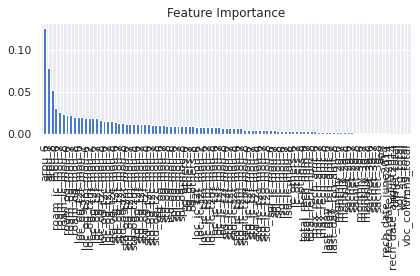

In [ ]:
from sklearn.ensemble import RandomForestClassifier

feat_labels = feat_cols

forest = RandomForestClassifier(n_estimators=500,
                                random_state=1)

forest.fit(X_train_scld, y_train)
importances = forest.feature_importances_

indices = np.argsort(importances)[::-1]

for f in range(X_train_scld.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30, 
                            feat_labels[indices[f]], 
                            importances[indices[f]]))

plt.title('Feature Importance')
plt.bar(range(X_train_scld.shape[1]), 
        importances[indices],
        align='center')

plt.xticks(range(X_train_scld.shape[1]), 
           feat_labels, rotation=90)
plt.xlim([-1, X_train_scld.shape[1]])
plt.tight_layout()
plt.show()

__Observation__

- Important features selected from RandomForest CLassifier are
   

## Building Decision Tree with selected features

In [ ]:
import statsmodels.api as sm

In [ ]:
X_train_feat = X_train_scld[['loc_ic_t2m_mou_8', 'arpu_8', 'max_rech_amt_8', 'loc_ic_t2m_mou_7', 'last_day_rch_amt_8',
                       'loc_ic_t2f_mou_8', 'total_rech_num_8', 'std_og_mou_8', 'std_ic_t2m_mou_8', 'roam_og_mou_8',
                       'loc_ic_t2t_mou_7', 'arpu_7', 'roam_ic_mou_8', 'aon', 'loc_og_t2m_mou_7', 'arpu_6', 'offnet_total',
                       'total_rech_num_7', 'loc_ic_t2m_mou_6', 'std_og_t2m_mou_8','loc_og_t2t_mou_7','total_rech_num_6','max_rech_amt_7',
                        'std_og_mou_6','loc_og_t2m_mou_6','loc_ic_t2t_mou_6','std_og_mou_7','spl_og_mou_8','roam_og_mou_7','std_og_t2m_mou_6',
                         'loc_og_t2t_mou_6','std_og_t2m_mou_7','max_rech_amt_6','rech_date_august2014','std_ic_t2t_mou_8','std_og_t2t_mou_6',
                         'std_ic_t2m_mou_6','roam_ic_mou_7','std_og_t2t_mou_8','loc_ic_t2f_mou_7']]

In [ ]:
X_test_feat =  X_train_scld[['loc_ic_t2m_mou_8', 'arpu_8', 'max_rech_amt_8', 'loc_ic_t2m_mou_7', 'last_day_rch_amt_8',
                       'loc_ic_t2f_mou_8', 'total_rech_num_8', 'std_og_mou_8', 'std_ic_t2m_mou_8', 'roam_og_mou_8',
                       'loc_ic_t2t_mou_7', 'arpu_7', 'roam_ic_mou_8', 'aon', 'loc_og_t2m_mou_7', 'arpu_6', 'offnet_total',
                       'total_rech_num_7', 'loc_ic_t2m_mou_6', 'std_og_t2m_mou_8','loc_og_t2t_mou_7','total_rech_num_6','max_rech_amt_7',
                        'std_og_mou_6','loc_og_t2m_mou_6','loc_ic_t2t_mou_6','std_og_mou_7','spl_og_mou_8','roam_og_mou_7','std_og_t2m_mou_6',
                         'loc_og_t2t_mou_6','std_og_t2m_mou_7','max_rech_amt_6','rech_date_august2014','std_ic_t2t_mou_8','std_og_t2t_mou_6',
                         'std_ic_t2m_mou_6','roam_ic_mou_7','std_og_t2t_mou_8','loc_ic_t2f_mou_7']]

In [ ]:
# importing decision tree libraries
from sklearn.tree import DecisionTreeClassifier

In [ ]:
# Importing required packages for visualization
from IPython.display import Image  
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [ ]:
dt_feat = DecisionTreeClassifier(max_depth=7)
dt_feat.fit(X_train_feat, y_train)

DecisionTreeClassifier(max_depth=7)

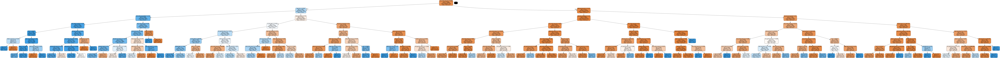

In [ ]:
# plotting tree with max_depth=7
dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_train_scld.columns, 
                class_names=['No Churn', "Churn"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())
#Image(graph.create_png(),width=800,height=900)
#graph.write_pdf("dt_telecomchurn.pdf")

## Model performance on Decicion Tree with selected features

In [ ]:
y_train_pred_dtfeat = dt.predict(X_train_scld)
y_test_pred_dtfeat = dt.predict(X_test_scld)

In [ ]:
print(accuracy_score(y_train, y_train_pred_dt))
print(confusion_matrix(y_train, y_train_pred_dt))
print()

0.943984914070201
[[61369  1498]
 [ 2423  4709]]



### XG Boost

In [ ]:
X_train_XGBOOST = X_train

In [ ]:
y_train_XGBOOST = y_train

In [ ]:
from xgboost import XGBRegressor

In [ ]:
regressor = XGBRegressor()

In [ ]:
#fit the model
#Training data is in X_train and the corresponding price value is in the Y_train
regressor.fit(X_train_XGBOOST, y_train_XGBOOST)